<a href="https://colab.research.google.com/github/escuccim/pytorch-face-autoencoder/blob/master/DenoisingDecoder2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [3]:
import torch
import torchvision
from torch import nn
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt, colors
%matplotlib inline
import zipfile
import os
import matplotlib.animation as animation
import torchvision.utils as vutils
import numpy as np
import random
import shutil
import pandas as pd
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import Dataset
from torch.optim import RMSprop,Adam,SGD
from torch.optim.lr_scheduler import ExponentialLR,MultiStepLR
import progressbar
from torchvision.utils import make_grid
from torchvision import models
from scipy.io import loadmat
from google.colab import auth
import PIL
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'gan-faces'

!gcloud config set project {project_id}

Updated property [core/project].


In [0]:
enc_model_save_path = "ae_noise_enc_2a.pt"
dec_model_save_path = "ae_noise_dec_2a.pt"
opt_save_path = "opt_ae_noise_2a.pt"
enc_opt_save_path = "opt_ae_noise_enc_2a.pt"
dec_opt_save_path = "opt_ae_noise_dec_2a.pt"

In [5]:
if not os.path.exists(enc_model_save_path):
    !gsutil cp gs://{bucket_name}/{enc_model_save_path} ./{enc_model_save_path} 
    !gsutil cp gs://{bucket_name}/{dec_model_save_path} ./{dec_model_save_path} 
    !gsutil cp gs://{bucket_name}/{opt_save_path} ./{opt_save_path}

Copying gs://gan-faces/ae_noise_enc_2a.pt...
/ [1 files][134.4 MiB/134.4 MiB]                                                
Operation completed over 1 objects/134.4 MiB.                                    
Copying gs://gan-faces/ae_noise_dec_2a.pt...
\ [1 files][ 83.6 MiB/ 83.6 MiB]                                                
Operation completed over 1 objects/83.6 MiB.                                     
Copying gs://gan-faces/opt_ae_noise_2a.pt...
- [1 files][217.8 MiB/217.8 MiB]                                                
Operation completed over 1 objects/217.8 MiB.                                    


In [6]:
# if not os.path.exists("celeba-dataset.zip"):
# #   !kaggle datasets download -d jessicali9530/celeba-dataset
#   !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
#   zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
#   zip_ref.extractall('data')
#   zip_ref.close()

#   zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()

if not os.path.exists("wiki_images_good.zip"):
  !gsutil cp gs://{bucket_name}/wiki_images_good.zip ./ 
  zip_ref = zipfile.ZipFile('wiki_images_good.zip', 'r')
  zip_ref.extractall('data/wiki_images')
  zip_ref.close()  

if not os.path.exists("celeb_a_good.zip"):
#   !kaggle datasets download -d jessicali9530/celeba-dataset
  !gsutil cp gs://{bucket_name}/celeb_a_good.zip ./celeb_a_good.zip
  zip_ref = zipfile.ZipFile('celeb_a_good.zip', 'r')
  zip_ref.extractall('data/images/celeb_a')
  zip_ref.close()

if not os.path.exists("Training_Pictures.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
  zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
  zip_ref.extractall('data/images/training')
  zip_ref.close()

if not os.path.exists("imdb_crop_good.zip"):  
  !gsutil cp gs://{bucket_name}/imdb_crop_good.zip ./imdb_crop_good.zip
  zip_ref = zipfile.ZipFile('imdb_crop_good.zip', 'r')
  zip_ref.extractall('data/images/imdb')
  zip_ref.close()

# if not os.path.exists("imdb_crop_test.zip"):
#   !gsutil cp gs://pneumonia/imdb_crop_test.zip ./imdb_crop_test.zip
#   zip_ref = zipfile.ZipFile('imdb_crop_test.zip', 'r')
#   zip_ref.extractall('data/images/')
#   zip_ref.close()     

# if not os.path.exists("named_celebs_good2.zip"):  
#   !gsutil cp gs://{bucket_name}/named_celebs_good2.zip ./named_celebs_good2.zip
#   zip_ref = zipfile.ZipFile('named_celebs_good2.zip', 'r')
#   zip_ref.extractall('data/images/')
#   zip_ref.close()

Copying gs://gan-faces/wiki_images_good.zip...
| [1 files][ 94.7 MiB/ 94.7 MiB]                                                
Operation completed over 1 objects/94.7 MiB.                                     
Copying gs://gan-faces/celeb_a_good.zip...
\ [1 files][  1.1 GiB/  1.1 GiB]   63.7 MiB/s                                   
Operation completed over 1 objects/1.1 GiB.                                      
--2019-12-30 11:40:29--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.156.41
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.156.41|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 955202 (933K) [application/zip]
Saving to: ‘Training_Pictures.zip’

Training_Pictures.z 100%[===================>] 932.81K  1.36MB/s    in 0.7s    

2019-12-30 11:40:31 (1.36 MB/s) - ‘Training_Pictures.zip’ saved [955202/955202]

Copying gs://gan-fac

In [7]:
if not os.path.exists("wiki_crop_test.zip"):
  !gsutil cp gs://pneumonia/wiki_crop_test.zip ./wiki_crop_test.zip
  zip_ref = zipfile.ZipFile('wiki_crop_test.zip', 'r')
  zip_ref.extractall('data/test_images/')
  zip_ref.close()   

# if not os.path.exists("imdb_crop_test.zip"):
#   !gsutil cp gs://pneumonia/imdb_crop_test.zip ./imdb_crop_test.zip
#   zip_ref = zipfile.ZipFile('imdb_crop_test.zip', 'r')
#   zip_ref.extractall('data/test_images/')
#   zip_ref.close()     

Copying gs://pneumonia/wiki_crop_test.zip...
- [1 files][ 27.5 MiB/ 27.5 MiB]                                                
Operation completed over 1 objects/27.5 MiB.                                     


In [0]:
# batch_size = BATCH_SIZE = 64
# data_path = "data/images/"
# image_size = (160,160)

# transform = torchvision.transforms.Compose(
#     [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
#      torchvision.transforms.RandomResizedCrop(image_size, scale=(0.95, 1.10)), 
#      torchvision.transforms.RandomApply([
#         torchvision.transforms.RandomAffine(degrees=2, translate=(0.05,0.05), scale=(0.95,1.05), shear=2, resample=False, fillcolor=0),        
#       ], 0.7),
#       # torchvision.transforms.ToTensor(),
#       # torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
#     ])

# tensor_normalize = torchvision.transforms.Compose([
#       torchvision.transforms.ToTensor(),
#       torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
#     ])

# noise_transform = torchvision.transforms.Lambda(lambda x: x + (torch.rand(x.shape) * 0.15))

# class SkewedImageFolder(torchvision.datasets.ImageFolder):
#   def __getitem__(self, index):
#         """
#         Args:
#             index (int): Index
#         Returns:
#             tuple: (sample, target) where target is class_index of the target class.
#         """
#         path, target = self.samples[index]
#         sample0 = self.loader(path)
#         if self.transform is not None:
#             target = self.transform(sample0)
        
#         sample = target.copy()

#         sample = sample.filter(PIL.ImageFilter.GaussianBlur(radius = 2))
#         sample = noise_transform(tensor_normalize(sample))
#         target = tensor_normalize(target)

#         return sample, target

# transform_mega = torchvision.transforms.Compose([
#       torchvision.transforms.RandomAffine(degrees=4, translate=(0.1,0.1), scale=(0.90,1.10), shear=8, resample=PIL.Image.BILINEAR, fillcolor=0),        
#     ])

# train_dataset = SkewedImageFolder(
#         root=data_path,
#         transform=transform,
#         target_transform=transform_mega
#     )

# train_loader = torch.utils.data.DataLoader(
#     train_dataset,
#     batch_size=batch_size,
#     num_workers=7,
#     shuffle=True
# )        

# train_dataset = SkewedImageFolder(
#         root=data_path,
#         transform=transform,
#         target_transform=transform_mega
#     )

# train_loader = torch.utils.data.DataLoader(
#     train_dataset,
#     batch_size=batch_size,
#     num_workers=2,
#     shuffle=True
# )        

# test_dataset = SkewedImageFolder(
#         root="data/test_images/",
#         transform=transform,
#         target_transform=transform_mega
#     )

# test_loader = torch.utils.data.DataLoader(
#     test_dataset,
#     batch_size=batch_size,
#     num_workers=2,
#     shuffle=True
# )

# print(train_dataset)

In [9]:
def umeyama( src, dst, estimate_scale ):
    """Estimate N-D similarity transformation with or without scaling.
    Parameters
    ----------
    src : (M, N) array
        Source coordinates.
    dst : (M, N) array
        Destination coordinates.
    estimate_scale : bool
        Whether to estimate scaling factor.
    Returns
    -------
    T : (N + 1, N + 1)
        The homogeneous similarity transformation matrix. The matrix contains
        NaN values only if the problem is not well-conditioned.
    References
    ----------
    .. [1] "Least-squares estimation of transformation parameters between two
            point patterns", Shinji Umeyama, PAMI 1991, DOI: 10.1109/34.88573
    """

    num = src.shape[0]
    dim = src.shape[1]

    # Compute mean of src and dst.
    src_mean = src.mean(axis=0)
    dst_mean = dst.mean(axis=0)

    # Subtract mean from src and dst.
    src_demean = src - src_mean
    dst_demean = dst - dst_mean

    # Eq. (38).
    A = np.dot(dst_demean.T, src_demean) / num

    # Eq. (39).
    d = np.ones((dim,), dtype=np.double)
    if np.linalg.det(A) < 0:
        d[dim - 1] = -1

    T = np.eye(dim + 1, dtype=np.double)

    U, S, V = np.linalg.svd(A)

    # Eq. (40) and (43).
    rank = np.linalg.matrix_rank(A)
    if rank == 0:
        return np.nan * T
    elif rank == dim - 1:
        if np.linalg.det(U) * np.linalg.det(V) > 0:
            T[:dim, :dim] = np.dot(U, V)
        else:
            s = d[dim - 1]
            d[dim - 1] = -1
            T[:dim, :dim] = np.dot(U, np.dot(np.diag(d), V))
            d[dim - 1] = s
    else:
        T[:dim, :dim] = np.dot(U, np.dot(np.diag(d), V.T))

    if estimate_scale:
        # Eq. (41) and (42).
        scale = 1.0 / src_demean.var(axis=0).sum() * np.dot(S, d)
    else:
        scale = 1.0

    T[:dim, dim] = dst_mean - scale * np.dot(T[:dim, :dim], src_mean.T)
    T[:dim, :dim] *= scale

    return T

import cv2

batch_size = BATCH_SIZE = 64
data_path = "data/images/"
image_size = (200,200)

def random_warp( image ):
    if image.shape[0] != 256:
      image = cv2.resize(image, (256,256))

    range_ = np.linspace( 128-80, 128+80, 10 )
    mapx = np.broadcast_to( range_, (10,10) )
    mapy = mapx.T

    mapx = mapx + np.random.normal( size=(10,10), scale=2.5 )
    mapy = mapy + np.random.normal( size=(10,10), scale=2.5 )

    interp_mapx = cv2.resize( mapx, (160,160) ).astype('float32')
    interp_mapy = cv2.resize( mapy, (160,160) ).astype('float32')

    warped_image = cv2.remap( image, interp_mapx, interp_mapy, cv2.INTER_LINEAR )

    src_points = np.stack( [ mapx.ravel(), mapy.ravel() ], axis=-1 )
    dst_points = np.mgrid[0:160:16,0:160:16].T.reshape(-1,2)

    mat = umeyama( src_points, dst_points, True )[0:2]

    target_image = cv2.warpAffine( image, mat, (160,160) )

    return warped_image, target_image

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
     torchvision.transforms.RandomResizedCrop(image_size, scale=(0.95, 1.10)), 
     torchvision.transforms.RandomApply([
        torchvision.transforms.RandomAffine(degrees=2, translate=(0.05,0.05), scale=(0.95,1.05), shear=2, resample=False, fillcolor=0),        
      ], 0.7),
      # torchvision.transforms.ToTensor(),
      # torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

tensor_normalize = torchvision.transforms.Compose([
      torchvision.transforms.ToTensor(),
      torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

noise_transform = torchvision.transforms.Lambda(lambda x: random_warp(x))

class SkewedImageFolder(torchvision.datasets.ImageFolder):
  def __getitem__(self, index):
        """
        Args:
            index (int): Index
        Returns:
            tuple: (sample, target) where target is class_index of the target class.
        """
        path, target = self.samples[index]
        # load the sample
        sample = self.loader(path)

        # apply the transformations
        if self.transform is not None:
            sample = self.transform(sample)
        
        # apply the random warping
        sample, target = noise_transform(np.array(sample))

        # normalize
        sample = tensor_normalize(sample)
        target = tensor_normalize(target)

        # target = tensor_normalize(target)
        # sample = tensor_normalize(sample)

        return sample, target

transform_mega = torchvision.transforms.Compose([
      torchvision.transforms.RandomAffine(degrees=4, translate=(0.1,0.1), scale=(0.90,1.10), shear=8, resample=PIL.Image.BILINEAR, fillcolor=0),        
    ])

train_dataset = SkewedImageFolder(
        root=data_path,
        transform=transform,
        target_transform=transform_mega
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    num_workers=7,
    shuffle=True
)        

train_dataset = SkewedImageFolder(
        root=data_path,
        transform=transform,
        target_transform=transform_mega
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    num_workers=7,
    shuffle=True
)        

test_dataset = SkewedImageFolder(
        root="data/test_images/",
        transform=transform,
        target_transform=transform_mega
    )

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=batch_size,
    num_workers=2,
    shuffle=True
)

print(train_dataset)

Dataset SkewedImageFolder
    Number of datapoints: 259299
    Root location: data/images/
    StandardTransform
Transform: Compose(
               RandomHorizontalFlip(p=0.5)
               RandomResizedCrop(size=(200, 200), scale=(0.95, 1.1), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
               RandomApply(
               p=0.7
               RandomAffine(degrees=(-2, 2), translate=(0.05, 0.05), scale=(0.95, 1.05), shear=(-2, 2))
           )
           )
Target transform: Compose(
                      RandomAffine(degrees=(-4, 4), translate=(0.1, 0.1), scale=(0.9, 1.1), shear=(-8, 8), resample=PIL.Image.BILINEAR)
                  )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


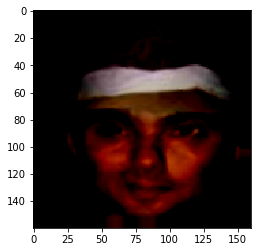

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


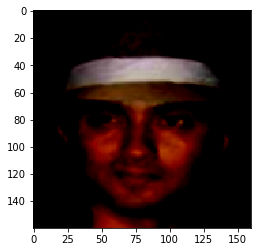

In [10]:
for (inputs, labels) in train_loader:
    plt.imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    plt.show()

    plt.imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()
    break

### Create Our Models


In [0]:
__all__ = ['ResNet', 'resnet18', 'resnet34', 'resnet50', 'resnet101',
           'resnet152', 'resnext50_32x4d', 'resnext101_32x8d',
           'wide_resnet50_2', 'wide_resnet101_2']


model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
    'resnext50_32x4d': 'https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth',
    'resnext101_32x8d': 'https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth',
    'wide_resnet50_2': 'https://download.pytorch.org/models/wide_resnet50_2-95faca4d.pth',
    'wide_resnet101_2': 'https://download.pytorch.org/models/wide_resnet101_2-32ee1156.pth',
}


def conv3x3(in_planes, out_planes, stride=1, groups=1, dilation=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=dilation, groups=groups, bias=False, dilation=dilation)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(BasicBlock, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        if groups != 1 or base_width != 64:
            raise ValueError('BasicBlock only supports groups=1 and base_width=64')
        if dilation > 1:
            raise NotImplementedError("Dilation > 1 not supported in BasicBlock")
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.relu = nn.LeakyReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(Bottleneck, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.)) * groups
        # Both self.conv2 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.LeakyReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class ResNet(nn.Module):

    def __init__(self, block, layers, num_classes=1000, zero_init_residual=False,
                 groups=1, width_per_group=64, replace_stride_with_dilation=None,
                 norm_layer=None):
        super(ResNet, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer

        self.inplanes = 64
        self.dilation = 1
        if replace_stride_with_dilation is None:
            # each element in the tuple indicates if we should replace
            # the 2x2 stride with a dilated convolution instead
            replace_stride_with_dilation = [False, False, False]
        if len(replace_stride_with_dilation) != 3:
            raise ValueError("replace_stride_with_dilation should be None "
                             "or a 3-element tuple, got {}".format(replace_stride_with_dilation))
        self.groups = groups
        self.base_width = width_per_group
        self.conv1 = nn.Conv2d(3, self.inplanes, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = norm_layer(self.inplanes)
        self.relu = nn.LeakyReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2,
                                       dilate=replace_stride_with_dilation[0])
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2,
                                       dilate=replace_stride_with_dilation[1])
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2,
                                       dilate=replace_stride_with_dilation[2])
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1, dilate=False):
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, self.groups,
                            self.base_width, previous_dilation, norm_layer))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes, groups=self.groups,
                                base_width=self.base_width, dilation=self.dilation,
                                norm_layer=norm_layer))

        return nn.Sequential(*layers)

    def _forward_impl(self, x):
        # See note [TorchScript super()]
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)

        return x

    def forward(self, x):
        return self._forward_impl(x)


def _resnet(arch, block, layers, pretrained, progress, **kwargs):
    model = ResNet(block, layers, **kwargs)
    if pretrained:
        state_dict = load_state_dict_from_url(model_urls[arch],
                                              progress=progress)
        model.load_state_dict(state_dict)
    return model


def resnet18(pretrained=False, progress=True, **kwargs):
    r"""ResNet-18 model from
    `"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet('resnet18', BasicBlock, [2, 2, 2, 2], pretrained, progress,
                   **kwargs)


def resnet34(pretrained=False, progress=True, **kwargs):
    r"""ResNet-34 model from
    `"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet('resnet34', BasicBlock, [3, 4, 6, 3], pretrained, progress,
                   **kwargs)

In [0]:
class Decoder(nn.Module):
    def __init__(self, latent_dim=784, initial_layers=32, ngpu=1):
        super(Decoder, self).__init__()
        self.ngpu = ngpu
        self.c1 = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, latent_dim, 5, 1, 0, bias=False),
            nn.BatchNorm2d(latent_dim),
            nn.LeakyReLU(0.2, inplace=False)
        )
        self.c2 = nn.Sequential(
            # state size. 256 x 5 x 5 
            nn.ConvTranspose2d(latent_dim, latent_dim // 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(latent_dim // 2),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c3 = nn.Sequential(
            # state size. 128 x 10 x 10
            nn.ConvTranspose2d(latent_dim // 2, latent_dim // 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(latent_dim // 4),
            nn.LeakyReLU(0.2, inplace=False)
        )
        self.c4 = nn.Sequential(
            # state size. 64 x 20 x 20
            nn.ConvTranspose2d(latent_dim // 4, latent_dim // 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(latent_dim // 8),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c5 = nn.Sequential(
            # state size. 64 x 40 x 40
            nn.ConvTranspose2d(latent_dim // 8, latent_dim // 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(latent_dim // 16),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c6 = nn.Upsample((159,159), mode='bilinear', align_corners=False)

        self.c7 = nn.Sequential(
            # state size. 3 x 80 x 80
            nn.ConvTranspose2d(latent_dim // 16, 3, 4, 1, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        b_size = input.shape[0]
        x = self.c1(input.view(b_size, -1, 1, 1))
        x = self.c2(x)
        x = self.c3(x)
        x = self.c4(x)
        x = self.c5(x)
        x = self.c6(x)
        x = self.c7(x)

        return x

class Autoencoder(nn.Module):
    def __init__(self, latent_dim=512):
        super(Autoencoder, self).__init__()
        self.encoder = models.resnet34(pretrained=True)
        self.encoder.avgpool = nn.Sequential(
            nn.BatchNorm2d(512),
            nn.Conv2d(512, 1024, kernel_size=5, stride=5, padding=0, bias=False),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=False)
        )
        
        num_ftrs = 1024
        self.encoder.fc = nn.Linear(num_ftrs, latent_dim)   
        self.decoder = Decoder(latent_dim=latent_dim)
    
    def forward(self, inputs):
        code = self.encoder(inputs)
        x = self.decoder(code)

        return x

In [13]:
criterion = nn.MSELoss()
autoencoder = Autoencoder(latent_dim=784).cuda()

lr = 1e-4
decay_lr = 0.90

optimizer = RMSprop(params=autoencoder.parameters(), lr=lr, alpha=0.9, eps=1e-8, weight_decay=0, momentum=0, centered=False)
lr = ExponentialLR(optimizer, gamma=decay_lr)

# optimizer_encoder = RMSprop(params=autoencoder.encoder.parameters(),lr=lr,alpha=0.9,eps=1e-8,weight_decay=0,momentum=0,centered=False)
# lr_encoder = ExponentialLR(optimizer_encoder, gamma=decay_lr)

# # optimizer_decoder = Adam(params=net.decoder.parameters(),lr = lr,betas=(0.9,0.999))
# optimizer_decoder = RMSprop(params=autoencoder.decoder.parameters(),lr=lr,alpha=0.9,eps=1e-8,weight_decay=0,momentum=0,centered=False)
# lr_decoder = ExponentialLR(optimizer_decoder, gamma=decay_lr)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 49.2MB/s]


In [14]:
def count_params(model):
    model_parameters = filter(lambda p: p.requires_grad, model.parameters())
    params = sum([np.prod(p.size()) for p in model_parameters])
    return params        

# print("Autoencoder Params:", count_params(netG))
print("Encoder Params:", count_params(autoencoder.encoder))
print("Decoder Params:", count_params(autoencoder.decoder))

Encoder Params: 35198544
Decoder Params: 21902510


In [0]:
# try to load the models
try:
    autoencoder.decoder.load_state_dict(torch.load(dec_model_save_path))
    autoencoder.encoder.load_state_dict(torch.load(enc_model_save_path))
    optimizer.load_state_dict(torch.load(opt_save_path))
except Exception as e:
    print("Error loading model", e)

In [0]:
enc_model_save_path = "ae_noise_enc_2.1a.pt"
dec_model_save_path = "ae_noise_dec_2.1a.pt"
opt_save_path = "opt_ae_noise_2.1a.pt"
enc_opt_save_path = "opt_ae_noise_enc_2.1a.pt"
dec_opt_save_path = "opt_ae_noise_dec_2.1a.pt"

In [0]:
def train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=5, plot_images=1000):
    try:
        for epoch in range(n_epochs):
            autoencoder.train()
            train_losses = []

            for i, (inputs, labels) in enumerate(train_loader):
                inputs = inputs.cuda()
                labels = labels.cuda()
                decoded = autoencoder(inputs)

                loss = criterion(decoded, labels)
                train_losses.append(loss.item())
                loss.backward()

                optimizer.step()

                if i % 200 == 0:
                    print('[%d/%d][%d/%d]\tLoss: %.5f'
                          % (epoch, n_epochs, i, len(train_loader), np.mean(train_losses)))

                if i % plot_images == 0 and i > 0:
                    fig, ax = plt.subplots(1, 3, figsize=(8,8))
                    ax[0].imshow(np.transpose(vutils.make_grid(decoded[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                    ax[1].imshow(np.transpose(vutils.make_grid(labels[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                    ax[2].imshow(np.transpose(vutils.make_grid(inputs[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                    plt.show()

            print('[%d/%d][%d/%d]\tLoss: %.5f' % (epoch, n_epochs, i, len(train_loader), np.mean(train_losses)))
            
            test_losses = []
            autoencoder.eval()
            with torch.no_grad():
                for (inputs, labels) in test_loader:
                    inputs = inputs.cuda()
                    labels = labels.cuda()
                    decoded = autoencoder(inputs)

                    loss = criterion(decoded, labels)
                    test_losses.append(loss.item())

                print('[%d/%d][%d/%d]\tTr Loss: %.5f\tTe Loss: %.5f' % (epoch, n_epochs, i, len(train_loader), np.mean(train_losses), np.mean(test_losses)))

                fig, ax = plt.subplots(1, 3, figsize=(8,8))
                ax[0].imshow(np.transpose(vutils.make_grid(decoded[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                ax[1].imshow(np.transpose(vutils.make_grid(labels[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                ax[2].imshow(np.transpose(vutils.make_grid(inputs[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                plt.show()

            torch.save(autoencoder.encoder.state_dict(), enc_model_save_path)
            torch.save(autoencoder.decoder.state_dict(), dec_model_save_path)
            torch.save(optimizer.state_dict(), opt_save_path)
            lr.step()
    except KeyboardInterrupt:
        print("Interrupt, saving...")
        torch.save(autoencoder.encoder.state_dict(), enc_model_save_path)
        torch.save(autoencoder.decoder.state_dict(), dec_model_save_path)
        torch.save(optimizer.state_dict(), opt_save_path)

    !gsutil cp ./{enc_model_save_path} gs://{bucket_name}/{enc_model_save_path}
    !gsutil cp ./{dec_model_save_path} gs://{bucket_name}/{dec_model_save_path}
    !gsutil cp ./{opt_save_path} gs://{bucket_name}/{opt_save_path}

[0/2][0/2686]	Loss: 1.0099
[0/2][200/2686]	Loss: 0.3690
[0/2][400/2686]	Loss: 0.3329


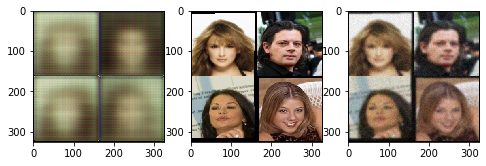

[0/2][600/2686]	Loss: 0.3049
[0/2][800/2686]	Loss: 0.2908
[0/2][1000/2686]	Loss: 0.2800


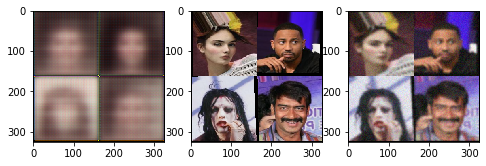

[0/2][1200/2686]	Loss: 0.2723
[0/2][1400/2686]	Loss: 0.2671


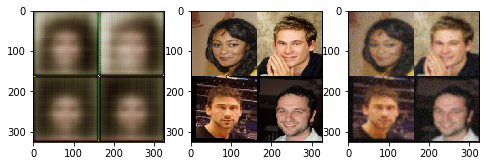

[0/2][1600/2686]	Loss: 0.2637
[0/2][1800/2686]	Loss: 0.2602
[0/2][2000/2686]	Loss: 0.2563


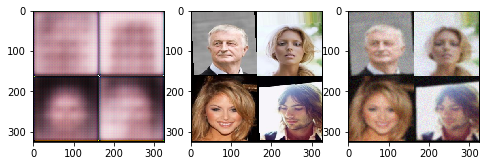

[0/2][2200/2686]	Loss: 0.2534
[0/2][2400/2686]	Loss: 0.2508


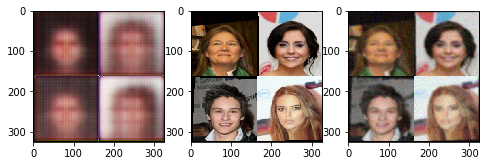

[0/2][2600/2686]	Loss: 0.2486
[0/2][2685/2686]	Loss: 0.2476
[0/2][2685/2686]	Tr Loss: 0.2476	Te Loss: 0.2498


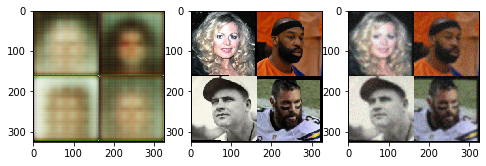

[1/2][0/2686]	Loss: 0.2213
[1/2][200/2686]	Loss: 0.2143
[1/2][400/2686]	Loss: 0.2153


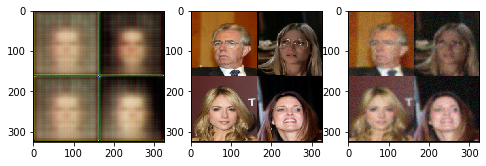

[1/2][600/2686]	Loss: 0.2165
[1/2][800/2686]	Loss: 0.2151
[1/2][1000/2686]	Loss: 0.2142


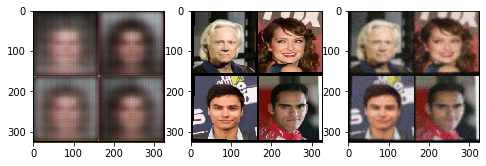

[1/2][1200/2686]	Loss: 0.2134
[1/2][1400/2686]	Loss: 0.2136


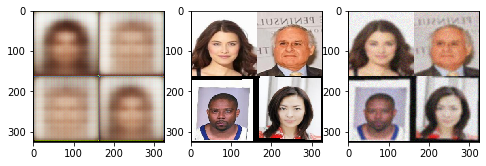

[1/2][1600/2686]	Loss: 0.2135
[1/2][1800/2686]	Loss: 0.2133
[1/2][2000/2686]	Loss: 0.2135


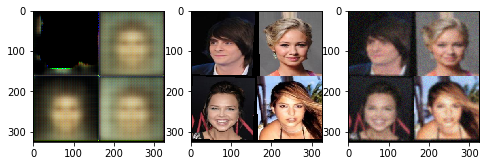

[1/2][2200/2686]	Loss: 0.2136
[1/2][2400/2686]	Loss: 0.2134


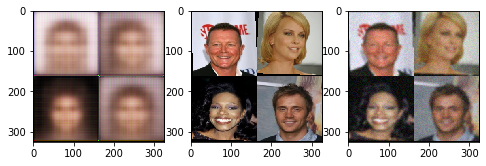

[1/2][2600/2686]	Loss: 0.2136
[1/2][2685/2686]	Loss: 0.2137
[1/2][2685/2686]	Tr Loss: 0.2137	Te Loss: 0.2455


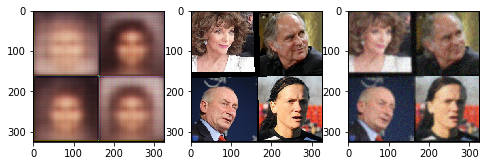

Copying file://./ae_noise_enc_2a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/134.4 MiB.                                    
Copying file://./ae_noise_dec_2a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/83.6 MiB.                                     
Copying file://./opt_ae_noise_2a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=2, plot_images=500)

[0/5][0/2686]	Loss: 0.1244
[0/5][200/2686]	Loss: 0.1261
[0/5][400/2686]	Loss: 0.1269
[0/5][600/2686]	Loss: 0.1260
[0/5][800/2686]	Loss: 0.1256
[0/5][1000/2686]	Loss: 0.1247
[0/5][1200/2686]	Loss: 0.1239
[0/5][1400/2686]	Loss: 0.1228


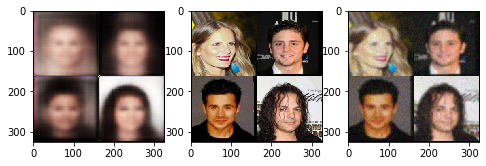

[0/5][1600/2686]	Loss: 0.1221
[0/5][1800/2686]	Loss: 0.1218
[0/5][2000/2686]	Loss: 0.1214
[0/5][2200/2686]	Loss: 0.1209
[0/5][2400/2686]	Loss: 0.1206
[0/5][2600/2686]	Loss: 0.1201
[0/5][2685/2686]	Loss: 0.1200
[0/5][2685/2686]	Tr Loss: 0.1200	Te Loss: 0.1484


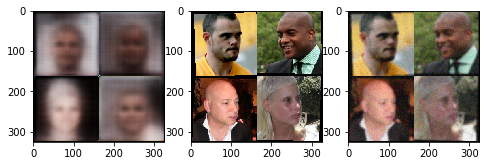

[1/5][0/2686]	Loss: 0.1256
[1/5][200/2686]	Loss: 0.1175
[1/5][400/2686]	Loss: 0.1173
[1/5][600/2686]	Loss: 0.1177
[1/5][800/2686]	Loss: 0.1183
[1/5][1000/2686]	Loss: 0.1186
[1/5][1200/2686]	Loss: 0.1183
[1/5][1400/2686]	Loss: 0.1182


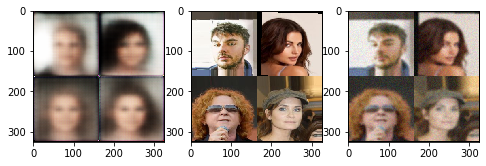

[1/5][1600/2686]	Loss: 0.1184
[1/5][1800/2686]	Loss: 0.1183
[1/5][2000/2686]	Loss: 0.1182
[1/5][2200/2686]	Loss: 0.1180
[1/5][2400/2686]	Loss: 0.1178
[1/5][2600/2686]	Loss: 0.1175
[1/5][2685/2686]	Loss: 0.1174
[1/5][2685/2686]	Tr Loss: 0.1174	Te Loss: 0.1436


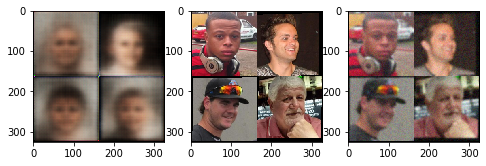

[2/5][0/2686]	Loss: 0.1146
[2/5][200/2686]	Loss: 0.1156
[2/5][400/2686]	Loss: 0.1148
[2/5][600/2686]	Loss: 0.1143
[2/5][800/2686]	Loss: 0.1139
[2/5][1000/2686]	Loss: 0.1133
[2/5][1200/2686]	Loss: 0.1129
[2/5][1400/2686]	Loss: 0.1129


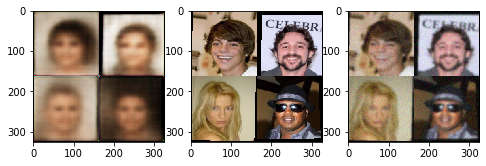

[2/5][1600/2686]	Loss: 0.1129
[2/5][1800/2686]	Loss: 0.1127
[2/5][2000/2686]	Loss: 0.1126
[2/5][2200/2686]	Loss: 0.1125
[2/5][2400/2686]	Loss: 0.1122
[2/5][2600/2686]	Loss: 0.1120
[2/5][2685/2686]	Loss: 0.1119
[2/5][2685/2686]	Tr Loss: 0.1119	Te Loss: 0.1395


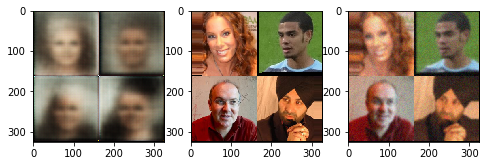

[3/5][0/2686]	Loss: 0.1144
[3/5][200/2686]	Loss: 0.1126
[3/5][400/2686]	Loss: 0.1134
[3/5][600/2686]	Loss: 0.1123
[3/5][800/2686]	Loss: 0.1114
[3/5][1000/2686]	Loss: 0.1113
[3/5][1200/2686]	Loss: 0.1109
[3/5][1400/2686]	Loss: 0.1107


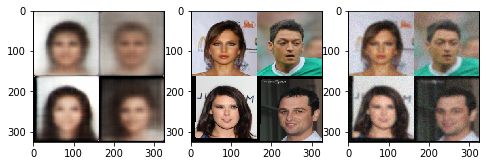

[3/5][1600/2686]	Loss: 0.1103
[3/5][1800/2686]	Loss: 0.1099
[3/5][2000/2686]	Loss: 0.1098
[3/5][2200/2686]	Loss: 0.1096
[3/5][2400/2686]	Loss: 0.1095
[3/5][2600/2686]	Loss: 0.1093
[3/5][2685/2686]	Loss: 0.1092
[3/5][2685/2686]	Tr Loss: 0.1092	Te Loss: 0.1410


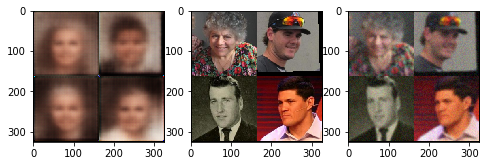

[4/5][0/2686]	Loss: 0.1082
[4/5][200/2686]	Loss: 0.1069
[4/5][400/2686]	Loss: 0.1072
[4/5][600/2686]	Loss: 0.1070
[4/5][800/2686]	Loss: 0.1069
[4/5][1000/2686]	Loss: 0.1071
[4/5][1200/2686]	Loss: 0.1072
[4/5][1400/2686]	Loss: 0.1074


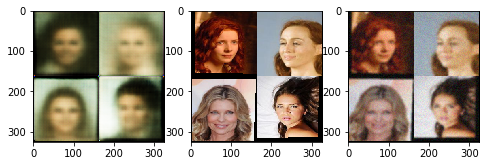

[4/5][1600/2686]	Loss: 0.1074
[4/5][1800/2686]	Loss: 0.1073
[4/5][2000/2686]	Loss: 0.1073
[4/5][2200/2686]	Loss: 0.1071
[4/5][2400/2686]	Loss: 0.1069
[4/5][2600/2686]	Loss: 0.1068
[4/5][2685/2686]	Loss: 0.1067
[4/5][2685/2686]	Tr Loss: 0.1067	Te Loss: 0.1387


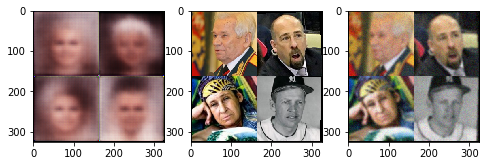

Copying file://./ae_noise_enc_2a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/134.4 MiB.                                    
Copying file://./ae_noise_dec_2a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/83.6 MiB.                                     
Copying file://./opt_ae_noise_2a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=5, plot_images=1500)

[0/5][0/2686]	Loss: 0.1048
[0/5][200/2686]	Loss: 0.1046
[0/5][400/2686]	Loss: 0.1048
[0/5][600/2686]	Loss: 0.1048
[0/5][800/2686]	Loss: 0.1047
[0/5][1000/2686]	Loss: 0.1043
[0/5][1200/2686]	Loss: 0.1042
[0/5][1400/2686]	Loss: 0.1039
[0/5][1600/2686]	Loss: 0.1039
[0/5][1800/2686]	Loss: 0.1037
[0/5][2000/2686]	Loss: 0.1035
[0/5][2200/2686]	Loss: 0.1034
[0/5][2400/2686]	Loss: 0.1033
[0/5][2600/2686]	Loss: 0.1031
[0/5][2685/2686]	Loss: 0.1031
[0/5][2685/2686]	Tr Loss: 0.1031	Te Loss: 0.1343


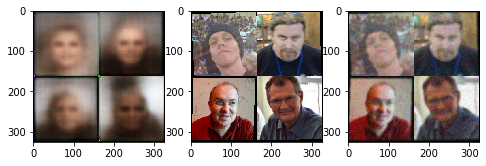

[1/5][0/2686]	Loss: 0.1080
[1/5][200/2686]	Loss: 0.1000
[1/5][400/2686]	Loss: 0.1005
[1/5][600/2686]	Loss: 0.1005
[1/5][800/2686]	Loss: 0.1005
[1/5][1000/2686]	Loss: 0.1007
[1/5][1200/2686]	Loss: 0.1004
[1/5][1400/2686]	Loss: 0.1004
[1/5][1600/2686]	Loss: 0.1004
[1/5][1800/2686]	Loss: 0.1005
[1/5][2000/2686]	Loss: 0.1004
[1/5][2200/2686]	Loss: 0.1004
[1/5][2400/2686]	Loss: 0.1002
[1/5][2600/2686]	Loss: 0.1004
[1/5][2685/2686]	Loss: 0.1004
[1/5][2685/2686]	Tr Loss: 0.1004	Te Loss: 0.1334


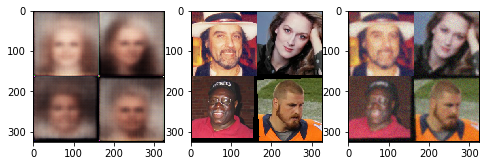

[2/5][0/2686]	Loss: 0.1033
[2/5][200/2686]	Loss: 0.0991
[2/5][400/2686]	Loss: 0.0987
[2/5][600/2686]	Loss: 0.0984
[2/5][800/2686]	Loss: 0.0985
[2/5][1000/2686]	Loss: 0.0985
[2/5][1200/2686]	Loss: 0.0984
[2/5][1400/2686]	Loss: 0.0984
[2/5][1600/2686]	Loss: 0.0982
[2/5][1800/2686]	Loss: 0.0982
[2/5][2000/2686]	Loss: 0.0981
[2/5][2200/2686]	Loss: 0.0981
[2/5][2400/2686]	Loss: 0.0982
[2/5][2600/2686]	Loss: 0.0982
[2/5][2685/2686]	Loss: 0.0982
[2/5][2685/2686]	Tr Loss: 0.0982	Te Loss: 0.1383


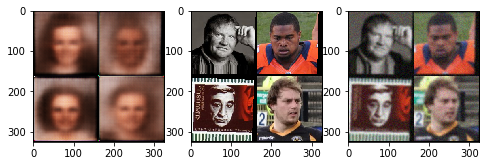

[3/5][0/2686]	Loss: 0.1116
[3/5][200/2686]	Loss: 0.0994
[3/5][400/2686]	Loss: 0.0979
[3/5][600/2686]	Loss: 0.0975
[3/5][800/2686]	Loss: 0.0974
[3/5][1000/2686]	Loss: 0.0975
[3/5][1200/2686]	Loss: 0.0974
[3/5][1400/2686]	Loss: 0.0972
[3/5][1600/2686]	Loss: 0.0970
[3/5][1800/2686]	Loss: 0.0970
[3/5][2000/2686]	Loss: 0.0969
[3/5][2200/2686]	Loss: 0.0969
[3/5][2400/2686]	Loss: 0.0969
[3/5][2600/2686]	Loss: 0.0968
[3/5][2685/2686]	Loss: 0.0968
[3/5][2685/2686]	Tr Loss: 0.0968	Te Loss: 0.1346


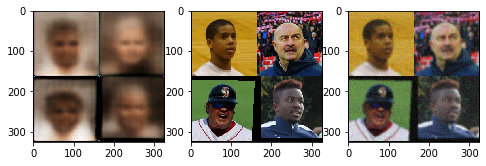

[4/5][0/2686]	Loss: 0.0972
[4/5][200/2686]	Loss: 0.0966
[4/5][400/2686]	Loss: 0.0958
[4/5][600/2686]	Loss: 0.0959
[4/5][800/2686]	Loss: 0.0959
[4/5][1000/2686]	Loss: 0.0959
[4/5][1200/2686]	Loss: 0.0957
[4/5][1400/2686]	Loss: 0.0956
[4/5][1600/2686]	Loss: 0.0957
[4/5][1800/2686]	Loss: 0.0958
[4/5][2000/2686]	Loss: 0.0957
[4/5][2200/2686]	Loss: 0.0956
[4/5][2400/2686]	Loss: 0.0956
[4/5][2600/2686]	Loss: 0.0956
[4/5][2685/2686]	Loss: 0.0956
[4/5][2685/2686]	Tr Loss: 0.0956	Te Loss: 0.1281


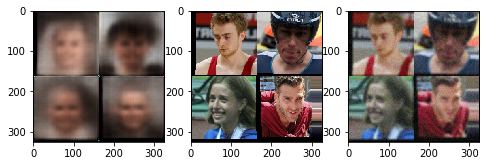

Copying file://./ae_noise_enc_2a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/134.4 MiB.                                    
Copying file://./ae_noise_dec_2a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/83.6 MiB.                                     
Copying file://./opt_ae_noise_2a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=5, plot_images=3000)

[0/5][0/2686]	Loss: 0.0897
[0/5][200/2686]	Loss: 0.0947
[0/5][400/2686]	Loss: 0.0951
[0/5][600/2686]	Loss: 0.0955
[0/5][800/2686]	Loss: 0.0955
[0/5][1000/2686]	Loss: 0.0953
[0/5][1200/2686]	Loss: 0.0951
[0/5][1400/2686]	Loss: 0.0952
[0/5][1600/2686]	Loss: 0.0951
[0/5][1800/2686]	Loss: 0.0950
[0/5][2000/2686]	Loss: 0.0948
[0/5][2200/2686]	Loss: 0.0947
[0/5][2400/2686]	Loss: 0.0946


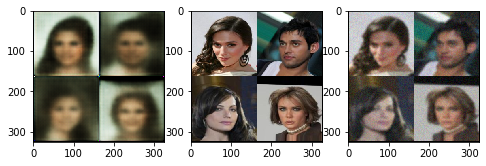

[0/5][2600/2686]	Loss: 0.0946
[0/5][2685/2686]	Loss: 0.0946
[0/5][2685/2686]	Tr Loss: 0.0946	Te Loss: 0.1304


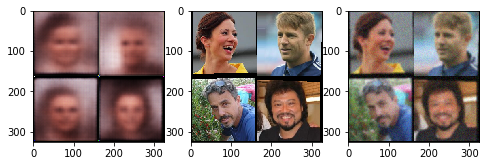

[1/5][0/2686]	Loss: 0.1043
[1/5][200/2686]	Loss: 0.0937
[1/5][400/2686]	Loss: 0.0934
[1/5][600/2686]	Loss: 0.0938
[1/5][800/2686]	Loss: 0.0939
[1/5][1000/2686]	Loss: 0.0939
[1/5][1200/2686]	Loss: 0.0940
[1/5][1400/2686]	Loss: 0.0940
[1/5][1600/2686]	Loss: 0.0939
[1/5][1800/2686]	Loss: 0.0938
[1/5][2000/2686]	Loss: 0.0937
[1/5][2200/2686]	Loss: 0.0936
[1/5][2400/2686]	Loss: 0.0935


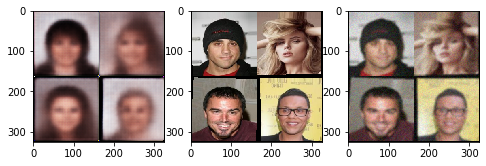

[1/5][2600/2686]	Loss: 0.0935
[1/5][2685/2686]	Loss: 0.0935
[1/5][2685/2686]	Tr Loss: 0.0935	Te Loss: 0.1272


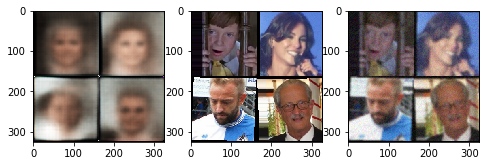

[2/5][0/2686]	Loss: 0.0958
[2/5][200/2686]	Loss: 0.0936
[2/5][400/2686]	Loss: 0.0934
[2/5][600/2686]	Loss: 0.0934
[2/5][800/2686]	Loss: 0.0932
[2/5][1000/2686]	Loss: 0.0931
[2/5][1200/2686]	Loss: 0.0930
[2/5][1400/2686]	Loss: 0.0929
[2/5][1600/2686]	Loss: 0.0929
[2/5][1800/2686]	Loss: 0.0929
[2/5][2000/2686]	Loss: 0.0930
[2/5][2200/2686]	Loss: 0.0929
[2/5][2400/2686]	Loss: 0.0928


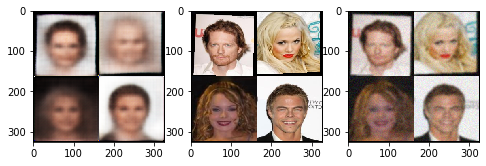

[2/5][2600/2686]	Loss: 0.0929
[2/5][2685/2686]	Loss: 0.0929
[2/5][2685/2686]	Tr Loss: 0.0929	Te Loss: 0.1285


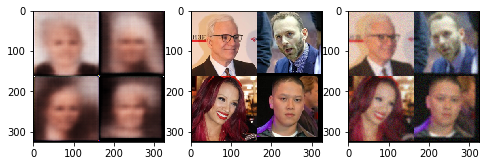

[3/5][0/2686]	Loss: 0.0946
[3/5][200/2686]	Loss: 0.0928
[3/5][400/2686]	Loss: 0.0927
[3/5][600/2686]	Loss: 0.0927
[3/5][800/2686]	Loss: 0.0926
[3/5][1000/2686]	Loss: 0.0924
[3/5][1200/2686]	Loss: 0.0923
[3/5][1400/2686]	Loss: 0.0924
[3/5][1600/2686]	Loss: 0.0922
[3/5][1800/2686]	Loss: 0.0922
[3/5][2000/2686]	Loss: 0.0921
[3/5][2200/2686]	Loss: 0.0920
[3/5][2400/2686]	Loss: 0.0919


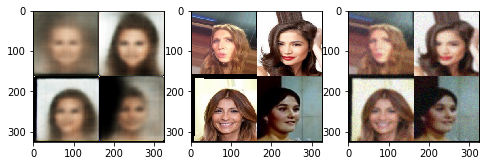

[3/5][2600/2686]	Loss: 0.0919
[3/5][2685/2686]	Loss: 0.0918
[3/5][2685/2686]	Tr Loss: 0.0918	Te Loss: 0.1264


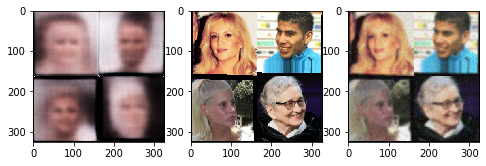

[4/5][0/2686]	Loss: 0.0916
[4/5][200/2686]	Loss: 0.0914
[4/5][400/2686]	Loss: 0.0912
[4/5][600/2686]	Loss: 0.0911
[4/5][800/2686]	Loss: 0.0911
[4/5][1000/2686]	Loss: 0.0908
[4/5][1200/2686]	Loss: 0.0907
[4/5][1400/2686]	Loss: 0.0907
[4/5][1600/2686]	Loss: 0.0906
[4/5][1800/2686]	Loss: 0.0905
[4/5][2000/2686]	Loss: 0.0905
[4/5][2200/2686]	Loss: 0.0904
[4/5][2400/2686]	Loss: 0.0903


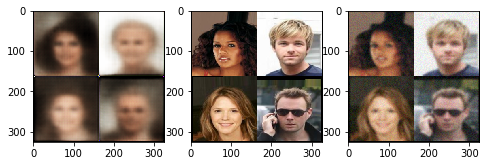

[4/5][2600/2686]	Loss: 0.0903
[4/5][2685/2686]	Loss: 0.0903
[4/5][2685/2686]	Tr Loss: 0.0903	Te Loss: 0.1233


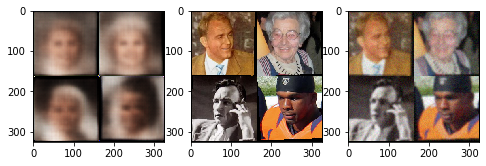

Copying file://./ae_noise_enc_2a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/134.4 MiB.                                    
Copying file://./ae_noise_dec_2a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/83.6 MiB.                                     
Copying file://./opt_ae_noise_2a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=5, plot_images=2500)

[0/10][0/2686]	Loss: 0.0840
[0/10][200/2686]	Loss: 0.0917
[0/10][400/2686]	Loss: 0.0913
[0/10][600/2686]	Loss: 0.0916
[0/10][800/2686]	Loss: 0.0915
[0/10][1000/2686]	Loss: 0.0915
[0/10][1200/2686]	Loss: 0.0915
[0/10][1400/2686]	Loss: 0.0913


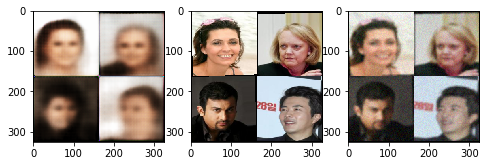

[0/10][1600/2686]	Loss: 0.0913
[0/10][1800/2686]	Loss: 0.0913
[0/10][2000/2686]	Loss: 0.0912
[0/10][2200/2686]	Loss: 0.0911
[0/10][2400/2686]	Loss: 0.0911
[0/10][2600/2686]	Loss: 0.0910
[0/10][2685/2686]	Loss: 0.0910
[0/10][2685/2686]	Tr Loss: 0.0910	Te Loss: 0.1212


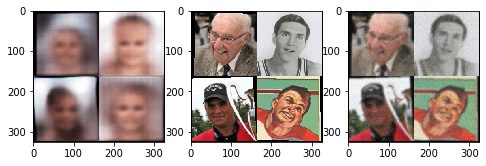

[1/10][0/2686]	Loss: 0.0893
[1/10][200/2686]	Loss: 0.0894
[1/10][400/2686]	Loss: 0.0901
[1/10][600/2686]	Loss: 0.0903
[1/10][800/2686]	Loss: 0.0903
[1/10][1000/2686]	Loss: 0.0902
[1/10][1200/2686]	Loss: 0.0901
[1/10][1400/2686]	Loss: 0.0899


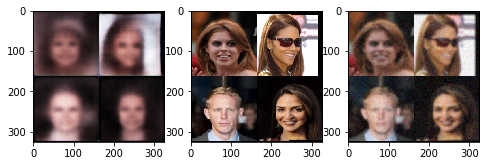

[1/10][1600/2686]	Loss: 0.0899
[1/10][1800/2686]	Loss: 0.0899
[1/10][2000/2686]	Loss: 0.0898
[1/10][2200/2686]	Loss: 0.0898
[1/10][2400/2686]	Loss: 0.0898
[1/10][2600/2686]	Loss: 0.0897
[1/10][2685/2686]	Loss: 0.0897
[1/10][2685/2686]	Tr Loss: 0.0897	Te Loss: 0.1233


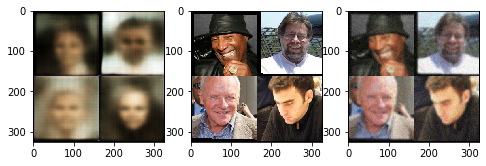

[2/10][0/2686]	Loss: 0.0993
[2/10][200/2686]	Loss: 0.0891
[2/10][400/2686]	Loss: 0.0895
[2/10][600/2686]	Loss: 0.0895
[2/10][800/2686]	Loss: 0.0890
[2/10][1000/2686]	Loss: 0.0889
[2/10][1200/2686]	Loss: 0.0889
[2/10][1400/2686]	Loss: 0.0889


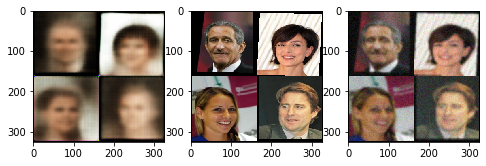

[2/10][1600/2686]	Loss: 0.0888
[2/10][1800/2686]	Loss: 0.0888
[2/10][2000/2686]	Loss: 0.0887
[2/10][2200/2686]	Loss: 0.0886
[2/10][2400/2686]	Loss: 0.0886
[2/10][2600/2686]	Loss: 0.0885
[2/10][2685/2686]	Loss: 0.0885
[2/10][2685/2686]	Tr Loss: 0.0885	Te Loss: 0.1204


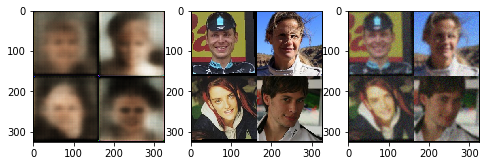

[3/10][0/2686]	Loss: 0.0836
[3/10][200/2686]	Loss: 0.0878
[3/10][400/2686]	Loss: 0.0876
[3/10][600/2686]	Loss: 0.0874
[3/10][800/2686]	Loss: 0.0874
[3/10][1000/2686]	Loss: 0.0874
[3/10][1200/2686]	Loss: 0.0873
[3/10][1400/2686]	Loss: 0.0876


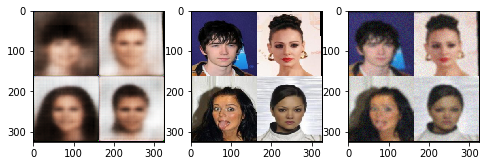

[3/10][1600/2686]	Loss: 0.0876
[3/10][1800/2686]	Loss: 0.0875
[3/10][2000/2686]	Loss: 0.0875
[3/10][2200/2686]	Loss: 0.0875
[3/10][2400/2686]	Loss: 0.0875
[3/10][2600/2686]	Loss: 0.0875
[3/10][2685/2686]	Loss: 0.0875
[3/10][2685/2686]	Tr Loss: 0.0875	Te Loss: 0.1219


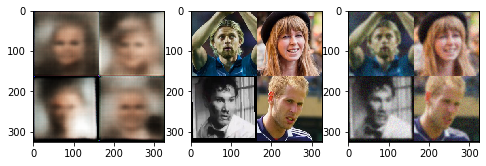

[4/10][0/2686]	Loss: 0.0831
[4/10][200/2686]	Loss: 0.0868
[4/10][400/2686]	Loss: 0.0867
[4/10][600/2686]	Loss: 0.0867
[4/10][800/2686]	Loss: 0.0867
[4/10][1000/2686]	Loss: 0.0866
[4/10][1200/2686]	Loss: 0.0865
[4/10][1400/2686]	Loss: 0.0864


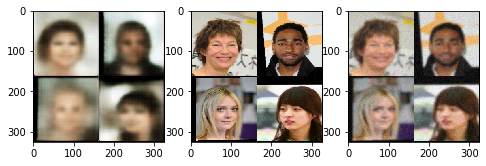

[4/10][1600/2686]	Loss: 0.0864
[4/10][1800/2686]	Loss: 0.0864
[4/10][2000/2686]	Loss: 0.0863
[4/10][2200/2686]	Loss: 0.0864
[4/10][2400/2686]	Loss: 0.0864
[4/10][2600/2686]	Loss: 0.0864
[4/10][2685/2686]	Loss: 0.0864
[4/10][2685/2686]	Tr Loss: 0.0864	Te Loss: 0.1208


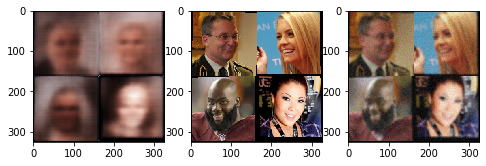

[5/10][0/2686]	Loss: 0.1028
[5/10][200/2686]	Loss: 0.0859
[5/10][400/2686]	Loss: 0.0861
[5/10][600/2686]	Loss: 0.0860
[5/10][800/2686]	Loss: 0.0860
[5/10][1000/2686]	Loss: 0.0859
[5/10][1200/2686]	Loss: 0.0858
[5/10][1400/2686]	Loss: 0.0858


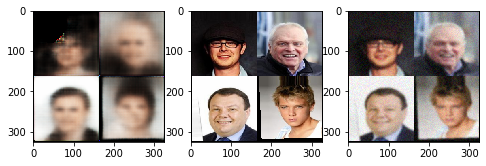

[5/10][1600/2686]	Loss: 0.0859
[5/10][1800/2686]	Loss: 0.0858
[5/10][2000/2686]	Loss: 0.0858
[5/10][2200/2686]	Loss: 0.0857
[5/10][2400/2686]	Loss: 0.0858
[5/10][2600/2686]	Loss: 0.0857
[5/10][2685/2686]	Loss: 0.0858
[5/10][2685/2686]	Tr Loss: 0.0858	Te Loss: 0.1213


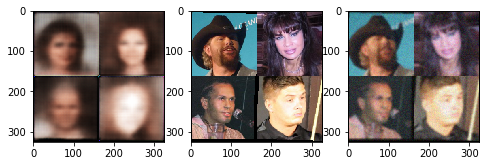

[6/10][0/2686]	Loss: 0.0797
[6/10][200/2686]	Loss: 0.0862
[6/10][400/2686]	Loss: 0.0859
[6/10][600/2686]	Loss: 0.0855
[6/10][800/2686]	Loss: 0.0854
[6/10][1000/2686]	Loss: 0.0853
[6/10][1200/2686]	Loss: 0.0854
[6/10][1400/2686]	Loss: 0.0854


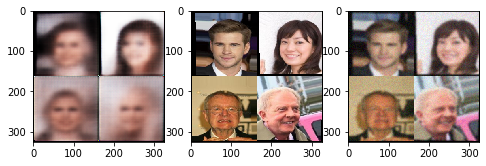

[6/10][1600/2686]	Loss: 0.0854
[6/10][1800/2686]	Loss: 0.0853
[6/10][2000/2686]	Loss: 0.0853
[6/10][2200/2686]	Loss: 0.0852
[6/10][2400/2686]	Loss: 0.0852
[6/10][2600/2686]	Loss: 0.0852
[6/10][2685/2686]	Loss: 0.0852
[6/10][2685/2686]	Tr Loss: 0.0852	Te Loss: 0.1170


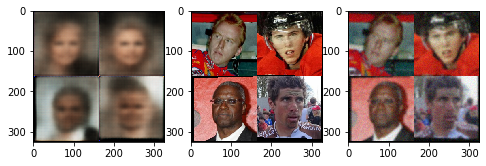

[7/10][0/2686]	Loss: 0.0841
[7/10][200/2686]	Loss: 0.0848
[7/10][400/2686]	Loss: 0.0850
[7/10][600/2686]	Loss: 0.0851
[7/10][800/2686]	Loss: 0.0851
[7/10][1000/2686]	Loss: 0.0850
[7/10][1200/2686]	Loss: 0.0849
[7/10][1400/2686]	Loss: 0.0848


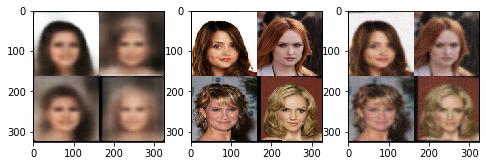

[7/10][1600/2686]	Loss: 0.0848
[7/10][1800/2686]	Loss: 0.0847
[7/10][2000/2686]	Loss: 0.0846
[7/10][2200/2686]	Loss: 0.0846
[7/10][2400/2686]	Loss: 0.0846
[7/10][2600/2686]	Loss: 0.0846
[7/10][2685/2686]	Loss: 0.0846
[7/10][2685/2686]	Tr Loss: 0.0846	Te Loss: 0.1163


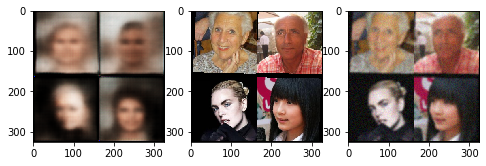

[8/10][0/2686]	Loss: 0.0907
[8/10][200/2686]	Loss: 0.0845
[8/10][400/2686]	Loss: 0.0839
[8/10][600/2686]	Loss: 0.0840
[8/10][800/2686]	Loss: 0.0842
[8/10][1000/2686]	Loss: 0.0843
[8/10][1200/2686]	Loss: 0.0844
[8/10][1400/2686]	Loss: 0.0844


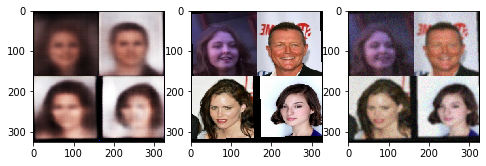

[8/10][1600/2686]	Loss: 0.0844
[8/10][1800/2686]	Loss: 0.0843
[8/10][2000/2686]	Loss: 0.0843
[8/10][2200/2686]	Loss: 0.0842
[8/10][2400/2686]	Loss: 0.0841
[8/10][2600/2686]	Loss: 0.0841
[8/10][2685/2686]	Loss: 0.0841
[8/10][2685/2686]	Tr Loss: 0.0841	Te Loss: 0.1162


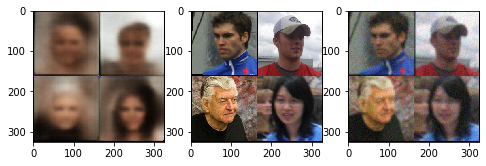

[9/10][0/2686]	Loss: 0.0880
[9/10][200/2686]	Loss: 0.0838
[9/10][400/2686]	Loss: 0.0837
[9/10][600/2686]	Loss: 0.0837
[9/10][800/2686]	Loss: 0.0834
[9/10][1000/2686]	Loss: 0.0834
[9/10][1200/2686]	Loss: 0.0835
[9/10][1400/2686]	Loss: 0.0835


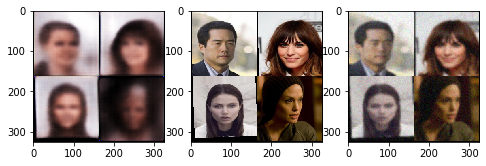

[9/10][1600/2686]	Loss: 0.0836
[9/10][1800/2686]	Loss: 0.0836
[9/10][2000/2686]	Loss: 0.0837
[9/10][2200/2686]	Loss: 0.0837
[9/10][2400/2686]	Loss: 0.0837
[9/10][2600/2686]	Loss: 0.0837
[9/10][2685/2686]	Loss: 0.0837
[9/10][2685/2686]	Tr Loss: 0.0837	Te Loss: 0.1178


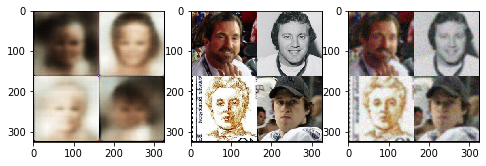

Copying file://./ae_noise_enc_2a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/134.4 MiB.                                    
Copying file://./ae_noise_dec_2a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/83.6 MiB.                                     
Copying file://./opt_ae_noise_2a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=10, plot_images=1500)

[0/10][0/4052]	Loss: 0.12618
[0/10][200/4052]	Loss: 0.12500
[0/10][400/4052]	Loss: 0.12379
[0/10][600/4052]	Loss: 0.12342
[0/10][800/4052]	Loss: 0.12339
[0/10][1000/4052]	Loss: 0.12325
[0/10][1200/4052]	Loss: 0.12303
[0/10][1400/4052]	Loss: 0.12287
[0/10][1600/4052]	Loss: 0.12262
[0/10][1800/4052]	Loss: 0.12235
[0/10][2000/4052]	Loss: 0.12215
[0/10][2200/4052]	Loss: 0.12207
[0/10][2400/4052]	Loss: 0.12183


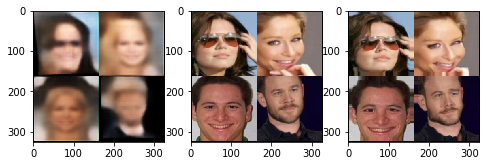

[0/10][2600/4052]	Loss: 0.12169
[0/10][2800/4052]	Loss: 0.12153
[0/10][3000/4052]	Loss: 0.12133
[0/10][3200/4052]	Loss: 0.12115
[0/10][3400/4052]	Loss: 0.12102
[0/10][3600/4052]	Loss: 0.12089
[0/10][3800/4052]	Loss: 0.12074
[0/10][4000/4052]	Loss: 0.12057
[0/10][4051/4052]	Loss: 0.12053
[0/10][4051/4052]	Tr Loss: 0.12053	Te Loss: 0.11823


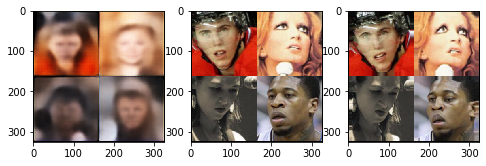

[1/10][0/4052]	Loss: 0.11318
[1/10][200/4052]	Loss: 0.11766
[1/10][400/4052]	Loss: 0.11721
[1/10][600/4052]	Loss: 0.11517
[1/10][800/4052]	Loss: 0.11317
[1/10][1000/4052]	Loss: 0.11126
[1/10][1200/4052]	Loss: 0.10947
[1/10][1400/4052]	Loss: 0.10778
[1/10][1600/4052]	Loss: 0.10627
[1/10][1800/4052]	Loss: 0.10497
[1/10][2000/4052]	Loss: 0.10378
[1/10][2200/4052]	Loss: 0.10268
[1/10][2400/4052]	Loss: 0.10171


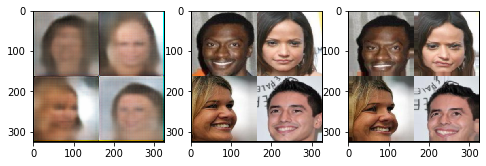

[1/10][2600/4052]	Loss: 0.10093
[1/10][2800/4052]	Loss: 0.10020
[1/10][3000/4052]	Loss: 0.09959
[1/10][3200/4052]	Loss: 0.09901
[1/10][3400/4052]	Loss: 0.09846
[1/10][3600/4052]	Loss: 0.09803
[1/10][3800/4052]	Loss: 0.09766
[1/10][4000/4052]	Loss: 0.09739
[1/10][4051/4052]	Loss: 0.09732
[1/10][4051/4052]	Tr Loss: 0.09732	Te Loss: 0.10090


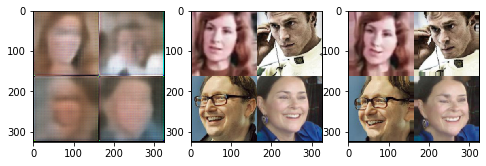

[2/10][0/4052]	Loss: 0.09239
[2/10][200/4052]	Loss: 0.09237
[2/10][400/4052]	Loss: 0.09319
[2/10][600/4052]	Loss: 0.09353
[2/10][800/4052]	Loss: 0.09386
[2/10][1000/4052]	Loss: 0.09432
[2/10][1200/4052]	Loss: 0.09472
[2/10][1400/4052]	Loss: 0.09511
[2/10][1600/4052]	Loss: 0.09536
[2/10][1800/4052]	Loss: 0.09556
[2/10][2000/4052]	Loss: 0.09573
[2/10][2200/4052]	Loss: 0.09586
[2/10][2400/4052]	Loss: 0.09600


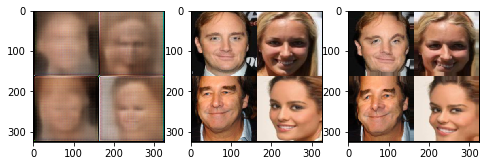

[2/10][2600/4052]	Loss: 0.09599
[2/10][2800/4052]	Loss: 0.09600
[2/10][3000/4052]	Loss: 0.09590
[2/10][3200/4052]	Loss: 0.09577
[2/10][3400/4052]	Loss: 0.09559
[2/10][3600/4052]	Loss: 0.09541
[2/10][3800/4052]	Loss: 0.09518
[2/10][4000/4052]	Loss: 0.09488
[2/10][4051/4052]	Loss: 0.09482
[2/10][4051/4052]	Tr Loss: 0.09482	Te Loss: 0.09939


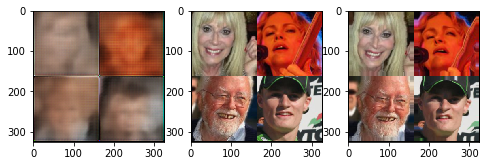

[3/10][0/4052]	Loss: 0.08527
[3/10][200/4052]	Loss: 0.08819
[3/10][400/4052]	Loss: 0.08756
[3/10][600/4052]	Loss: 0.08747
[3/10][800/4052]	Loss: 0.08721
[3/10][1000/4052]	Loss: 0.08701
[3/10][1200/4052]	Loss: 0.08683
[3/10][1400/4052]	Loss: 0.08665
[3/10][1600/4052]	Loss: 0.08646
[3/10][1800/4052]	Loss: 0.08623
[3/10][2000/4052]	Loss: 0.08603
[3/10][2200/4052]	Loss: 0.08588
[3/10][2400/4052]	Loss: 0.08571


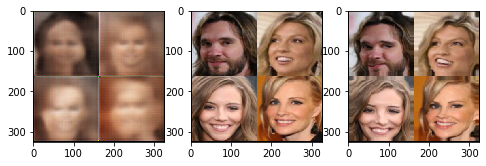

[3/10][2600/4052]	Loss: 0.08561
[3/10][2800/4052]	Loss: 0.08551
[3/10][3000/4052]	Loss: 0.08548
[3/10][3200/4052]	Loss: 0.08548
[3/10][3400/4052]	Loss: 0.08545
[3/10][3600/4052]	Loss: 0.08544
[3/10][3800/4052]	Loss: 0.08544
[3/10][4000/4052]	Loss: 0.08547
[3/10][4051/4052]	Loss: 0.08549
[3/10][4051/4052]	Tr Loss: 0.08549	Te Loss: 0.09200


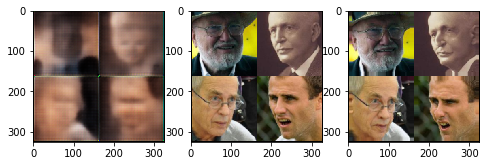

[4/10][0/4052]	Loss: 0.08914
[4/10][200/4052]	Loss: 0.08585
[4/10][400/4052]	Loss: 0.08623
[4/10][600/4052]	Loss: 0.08658
[4/10][800/4052]	Loss: 0.08680
[4/10][1000/4052]	Loss: 0.08706
[4/10][1200/4052]	Loss: 0.08715
[4/10][1400/4052]	Loss: 0.08720
[4/10][1600/4052]	Loss: 0.08737
[4/10][1800/4052]	Loss: 0.08752
[4/10][2000/4052]	Loss: 0.08773
[4/10][2200/4052]	Loss: 0.08797
[4/10][2400/4052]	Loss: 0.08816


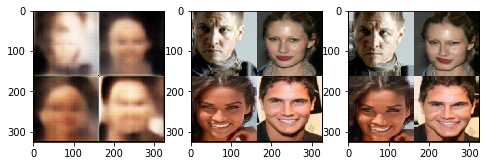

[4/10][2600/4052]	Loss: 0.08835
[4/10][2800/4052]	Loss: 0.08852
[4/10][3000/4052]	Loss: 0.08873
[4/10][3200/4052]	Loss: 0.08893
[4/10][3400/4052]	Loss: 0.08915
[4/10][3600/4052]	Loss: 0.08938
[4/10][3800/4052]	Loss: 0.08956
[4/10][4000/4052]	Loss: 0.08974
[4/10][4051/4052]	Loss: 0.08979
[4/10][4051/4052]	Tr Loss: 0.08979	Te Loss: 0.09732


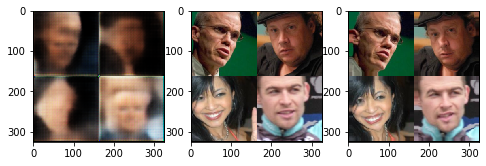

[5/10][0/4052]	Loss: 0.09603
[5/10][200/4052]	Loss: 0.09367
[5/10][400/4052]	Loss: 0.09374
[5/10][600/4052]	Loss: 0.09381
[5/10][800/4052]	Loss: 0.09392
[5/10][1000/4052]	Loss: 0.09404
[5/10][1200/4052]	Loss: 0.09417
[5/10][1400/4052]	Loss: 0.09423
[5/10][1600/4052]	Loss: 0.09426
[5/10][1800/4052]	Loss: 0.09432
[5/10][2000/4052]	Loss: 0.09434
[5/10][2200/4052]	Loss: 0.09434
[5/10][2400/4052]	Loss: 0.09435


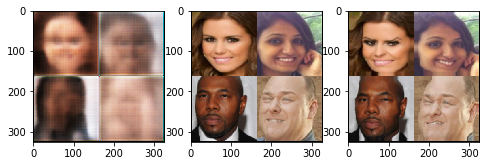

[5/10][2600/4052]	Loss: 0.09431
[5/10][2800/4052]	Loss: 0.09429
[5/10][3000/4052]	Loss: 0.09424
[5/10][3200/4052]	Loss: 0.09418
[5/10][3400/4052]	Loss: 0.09413
[5/10][3600/4052]	Loss: 0.09405
[5/10][3800/4052]	Loss: 0.09393
[5/10][4000/4052]	Loss: 0.09379
[5/10][4051/4052]	Loss: 0.09377
[5/10][4051/4052]	Tr Loss: 0.09377	Te Loss: 0.09547


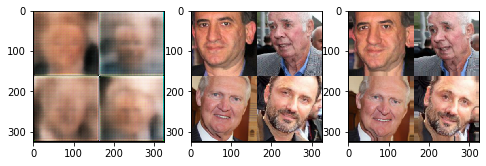

[6/10][0/4052]	Loss: 0.08585
[6/10][200/4052]	Loss: 0.09066
[6/10][400/4052]	Loss: 0.09032
[6/10][600/4052]	Loss: 0.09011
[6/10][800/4052]	Loss: 0.08991
[6/10][1000/4052]	Loss: 0.08970
[6/10][1200/4052]	Loss: 0.08953
[6/10][1400/4052]	Loss: 0.08934
[6/10][1600/4052]	Loss: 0.08918
[6/10][1800/4052]	Loss: 0.08903
[6/10][2000/4052]	Loss: 0.08881
[6/10][2200/4052]	Loss: 0.08859
[6/10][2400/4052]	Loss: 0.08841


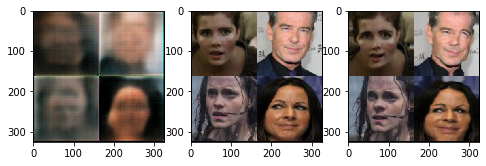

[6/10][2600/4052]	Loss: 0.08821
[6/10][2800/4052]	Loss: 0.08798
[6/10][3000/4052]	Loss: 0.08779
[6/10][3200/4052]	Loss: 0.08758
[6/10][3400/4052]	Loss: 0.08736
[6/10][3600/4052]	Loss: 0.08714
[6/10][3800/4052]	Loss: 0.08693
[6/10][4000/4052]	Loss: 0.08673
[6/10][4051/4052]	Loss: 0.08667
[6/10][4051/4052]	Tr Loss: 0.08667	Te Loss: 0.09058


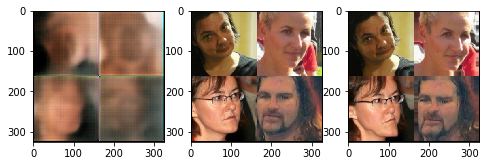

[7/10][0/4052]	Loss: 0.08115
[7/10][200/4052]	Loss: 0.08262
[7/10][400/4052]	Loss: 0.08204
[7/10][600/4052]	Loss: 0.08205
[7/10][800/4052]	Loss: 0.08186
[7/10][1000/4052]	Loss: 0.08166
[7/10][1200/4052]	Loss: 0.08150
[7/10][1400/4052]	Loss: 0.08130
[7/10][1600/4052]	Loss: 0.08112
[7/10][1800/4052]	Loss: 0.08101
[7/10][2000/4052]	Loss: 0.08082
[7/10][2200/4052]	Loss: 0.08063
[7/10][2400/4052]	Loss: 0.08043


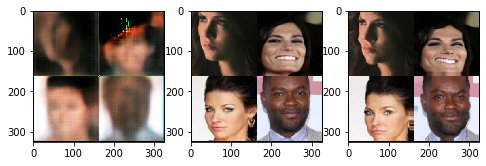

[7/10][2600/4052]	Loss: 0.08021
[7/10][2800/4052]	Loss: 0.07999
[7/10][3000/4052]	Loss: 0.07982
[7/10][3200/4052]	Loss: 0.07964
[7/10][3400/4052]	Loss: 0.07946
[7/10][3600/4052]	Loss: 0.07930
[7/10][3800/4052]	Loss: 0.07912
[7/10][4000/4052]	Loss: 0.07894
[7/10][4051/4052]	Loss: 0.07891
[7/10][4051/4052]	Tr Loss: 0.07891	Te Loss: 0.08664


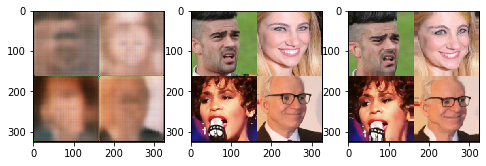

[8/10][0/4052]	Loss: 0.07300
[8/10][200/4052]	Loss: 0.07508
[8/10][400/4052]	Loss: 0.07519
[8/10][600/4052]	Loss: 0.07509
[8/10][800/4052]	Loss: 0.07495
[8/10][1000/4052]	Loss: 0.07489
[8/10][1200/4052]	Loss: 0.07470
[8/10][1400/4052]	Loss: 0.07459
[8/10][1600/4052]	Loss: 0.07448
[8/10][1800/4052]	Loss: 0.07439
[8/10][2000/4052]	Loss: 0.07426
[8/10][2200/4052]	Loss: 0.07420
[8/10][2400/4052]	Loss: 0.07413


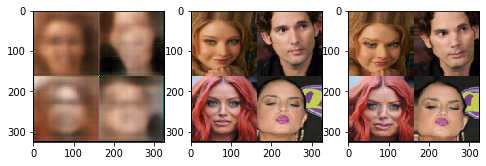

[8/10][2600/4052]	Loss: 0.07408
[8/10][2800/4052]	Loss: 0.07403
[8/10][3000/4052]	Loss: 0.07394
[8/10][3200/4052]	Loss: 0.07390
[8/10][3400/4052]	Loss: 0.07383
[8/10][3600/4052]	Loss: 0.07381
[8/10][3800/4052]	Loss: 0.07377
[8/10][4000/4052]	Loss: 0.07374
[8/10][4051/4052]	Loss: 0.07375
[8/10][4051/4052]	Tr Loss: 0.07375	Te Loss: 0.08355


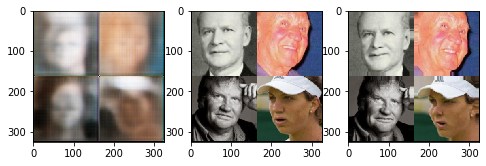

[9/10][0/4052]	Loss: 0.07718
[9/10][200/4052]	Loss: 0.07354
[9/10][400/4052]	Loss: 0.07338
[9/10][600/4052]	Loss: 0.07343
[9/10][800/4052]	Loss: 0.07350
[9/10][1000/4052]	Loss: 0.07368
[9/10][1200/4052]	Loss: 0.07377
[9/10][1400/4052]	Loss: 0.07386
[9/10][1600/4052]	Loss: 0.07399
[9/10][1800/4052]	Loss: 0.07408
[9/10][2000/4052]	Loss: 0.07421
[9/10][2200/4052]	Loss: 0.07432
[9/10][2400/4052]	Loss: 0.07443


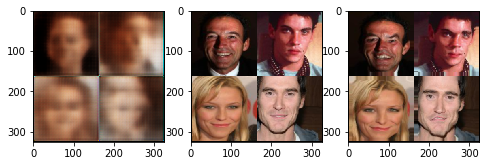

[9/10][2600/4052]	Loss: 0.07451
[9/10][2800/4052]	Loss: 0.07460
[9/10][3000/4052]	Loss: 0.07473
[9/10][3200/4052]	Loss: 0.07483
[9/10][3400/4052]	Loss: 0.07491
[9/10][3600/4052]	Loss: 0.07498
[9/10][3800/4052]	Loss: 0.07505
[9/10][4000/4052]	Loss: 0.07519
[9/10][4051/4052]	Loss: 0.07522
[9/10][4051/4052]	Tr Loss: 0.07522	Te Loss: 0.08399


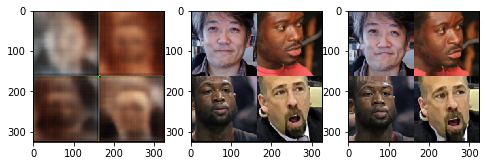

Copying file://./ae_noise_enc_2.1a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/134.4 MiB.                                    
Copying file://./ae_noise_dec_2.1a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/83.6 MiB.                                     
Copying file://./opt_ae_noise_2.1a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums

In [18]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=10, plot_images=2500)

[0/10][0/4052]	Loss: 0.07567
[0/10][200/4052]	Loss: 0.07705
[0/10][400/4052]	Loss: 0.07694
[0/10][600/4052]	Loss: 0.07712
[0/10][800/4052]	Loss: 0.07711
[0/10][1000/4052]	Loss: 0.07726
[0/10][1200/4052]	Loss: 0.07731
[0/10][1400/4052]	Loss: 0.07741
[0/10][1600/4052]	Loss: 0.07747
[0/10][1800/4052]	Loss: 0.07751
[0/10][2000/4052]	Loss: 0.07759


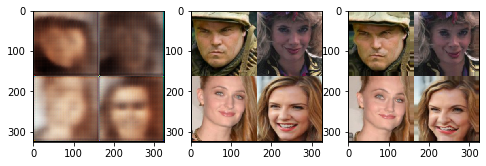

[0/10][2200/4052]	Loss: 0.07762
[0/10][2400/4052]	Loss: 0.07767
[0/10][2600/4052]	Loss: 0.07771
[0/10][2800/4052]	Loss: 0.07779
[0/10][3000/4052]	Loss: 0.07785
[0/10][3200/4052]	Loss: 0.07791
[0/10][3400/4052]	Loss: 0.07795
[0/10][3600/4052]	Loss: 0.07803
[0/10][3800/4052]	Loss: 0.07803
[0/10][4000/4052]	Loss: 0.07804


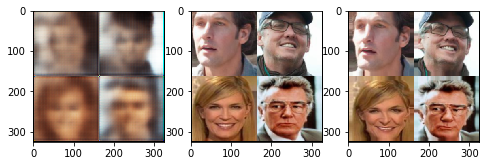

[0/10][4051/4052]	Loss: 0.07803
[0/10][4051/4052]	Tr Loss: 0.07803	Te Loss: 0.08542


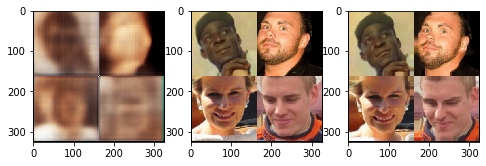

[1/10][0/4052]	Loss: 0.08312
[1/10][200/4052]	Loss: 0.07868
[1/10][400/4052]	Loss: 0.07863
[1/10][600/4052]	Loss: 0.07835
[1/10][800/4052]	Loss: 0.07818
[1/10][1000/4052]	Loss: 0.07809
[1/10][1200/4052]	Loss: 0.07788
[1/10][1400/4052]	Loss: 0.07782
[1/10][1600/4052]	Loss: 0.07765
[1/10][1800/4052]	Loss: 0.07753
[1/10][2000/4052]	Loss: 0.07742


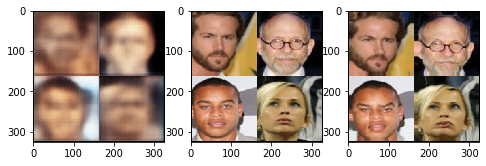

[1/10][2200/4052]	Loss: 0.07732
[1/10][2400/4052]	Loss: 0.07719
[1/10][2600/4052]	Loss: 0.07714
[1/10][2800/4052]	Loss: 0.07699
[1/10][3000/4052]	Loss: 0.07686
[1/10][3200/4052]	Loss: 0.07683
[1/10][3400/4052]	Loss: 0.07687
[1/10][3600/4052]	Loss: 0.07678
[1/10][3800/4052]	Loss: 0.07664
[1/10][4000/4052]	Loss: 0.07657


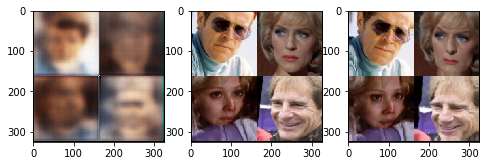

[1/10][4051/4052]	Loss: 0.07655
[1/10][4051/4052]	Tr Loss: 0.07655	Te Loss: 0.08362


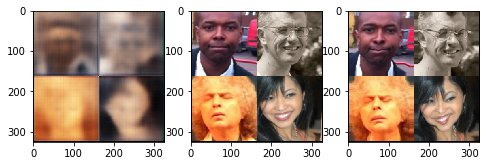

[2/10][0/4052]	Loss: 0.09526
[2/10][200/4052]	Loss: 0.07425
[2/10][400/4052]	Loss: 0.07429
[2/10][600/4052]	Loss: 0.07419
[2/10][800/4052]	Loss: 0.07417
[2/10][1000/4052]	Loss: 0.07408
[2/10][1200/4052]	Loss: 0.07387
[2/10][1400/4052]	Loss: 0.07384
[2/10][1600/4052]	Loss: 0.07376
[2/10][1800/4052]	Loss: 0.07371
[2/10][2000/4052]	Loss: 0.07365


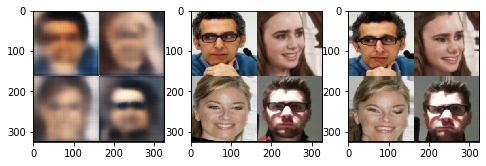

[2/10][2200/4052]	Loss: 0.07354
[2/10][2400/4052]	Loss: 0.07348
[2/10][2600/4052]	Loss: 0.07344
[2/10][2800/4052]	Loss: 0.07336
[2/10][3000/4052]	Loss: 0.07330
[2/10][3200/4052]	Loss: 0.07322
[2/10][3400/4052]	Loss: 0.07317
[2/10][3600/4052]	Loss: 0.07313
[2/10][3800/4052]	Loss: 0.07305
[2/10][4000/4052]	Loss: 0.07301


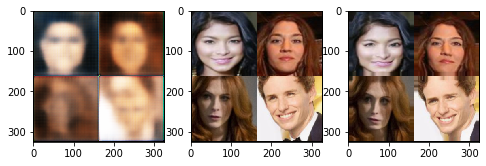

[2/10][4051/4052]	Loss: 0.07300
[2/10][4051/4052]	Tr Loss: 0.07300	Te Loss: 0.08180


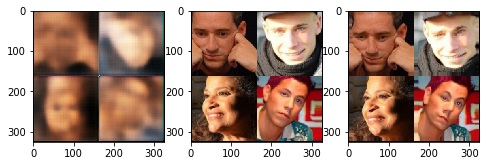

[3/10][0/4052]	Loss: 0.07560
[3/10][200/4052]	Loss: 0.07201
[3/10][400/4052]	Loss: 0.07167
[3/10][600/4052]	Loss: 0.07181
[3/10][800/4052]	Loss: 0.07187
[3/10][1000/4052]	Loss: 0.07175
[3/10][1200/4052]	Loss: 0.07164
[3/10][1400/4052]	Loss: 0.07159
[3/10][1600/4052]	Loss: 0.07157
[3/10][1800/4052]	Loss: 0.07156
[3/10][2000/4052]	Loss: 0.07156


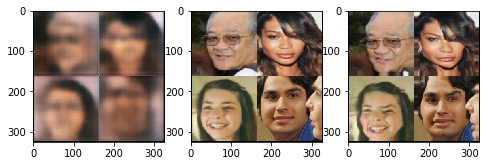

[3/10][2200/4052]	Loss: 0.07153
[3/10][2400/4052]	Loss: 0.07149
[3/10][2600/4052]	Loss: 0.07144
[3/10][2800/4052]	Loss: 0.07141
[3/10][3000/4052]	Loss: 0.07137
[3/10][3200/4052]	Loss: 0.07134
[3/10][3400/4052]	Loss: 0.07131
[3/10][3600/4052]	Loss: 0.07129
[3/10][3800/4052]	Loss: 0.07127
[3/10][4000/4052]	Loss: 0.07124


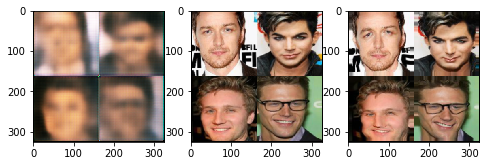

[3/10][4051/4052]	Loss: 0.07124
[3/10][4051/4052]	Tr Loss: 0.07124	Te Loss: 0.08054


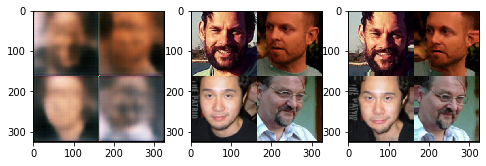

[4/10][0/4052]	Loss: 0.06950
[4/10][200/4052]	Loss: 0.07042
[4/10][400/4052]	Loss: 0.07042
[4/10][600/4052]	Loss: 0.07058
[4/10][800/4052]	Loss: 0.07064
[4/10][1000/4052]	Loss: 0.07053
[4/10][1200/4052]	Loss: 0.07058
[4/10][1400/4052]	Loss: 0.07057
[4/10][1600/4052]	Loss: 0.07061
[4/10][1800/4052]	Loss: 0.07058
[4/10][2000/4052]	Loss: 0.07058


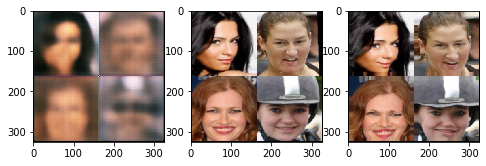

[4/10][2200/4052]	Loss: 0.07062
[4/10][2400/4052]	Loss: 0.07066
[4/10][2600/4052]	Loss: 0.07063
[4/10][2800/4052]	Loss: 0.07062
[4/10][3000/4052]	Loss: 0.07058
[4/10][3200/4052]	Loss: 0.07056
[4/10][3400/4052]	Loss: 0.07050
[4/10][3600/4052]	Loss: 0.07048
[4/10][3800/4052]	Loss: 0.07047
[4/10][4000/4052]	Loss: 0.07048


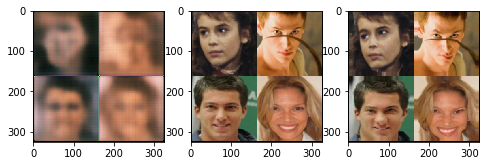

[4/10][4051/4052]	Loss: 0.07047
[4/10][4051/4052]	Tr Loss: 0.07047	Te Loss: 0.08028


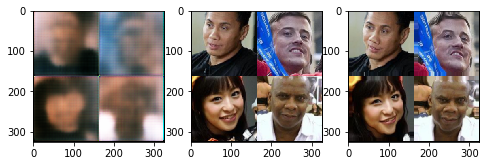

[5/10][0/4052]	Loss: 0.07560
[5/10][200/4052]	Loss: 0.07042
[5/10][400/4052]	Loss: 0.07023
[5/10][600/4052]	Loss: 0.07022
[5/10][800/4052]	Loss: 0.07012
[5/10][1000/4052]	Loss: 0.07012
[5/10][1200/4052]	Loss: 0.07000
[5/10][1400/4052]	Loss: 0.06995
[5/10][1600/4052]	Loss: 0.06994
[5/10][1800/4052]	Loss: 0.06991
[5/10][2000/4052]	Loss: 0.06989


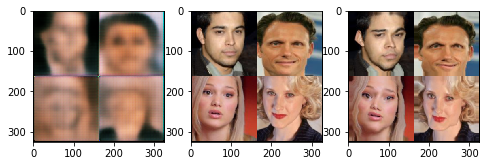

[5/10][2200/4052]	Loss: 0.06983
[5/10][2400/4052]	Loss: 0.06985
[5/10][2600/4052]	Loss: 0.06985
[5/10][2800/4052]	Loss: 0.06982
[5/10][3000/4052]	Loss: 0.06980
[5/10][3200/4052]	Loss: 0.06979
[5/10][3400/4052]	Loss: 0.06977
[5/10][3600/4052]	Loss: 0.06976
[5/10][3800/4052]	Loss: 0.06971
[5/10][4000/4052]	Loss: 0.06967


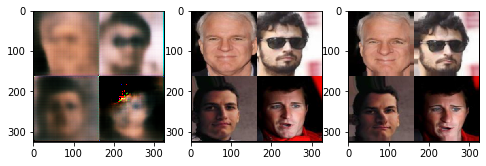

[5/10][4051/4052]	Loss: 0.06966
[5/10][4051/4052]	Tr Loss: 0.06966	Te Loss: 0.07957


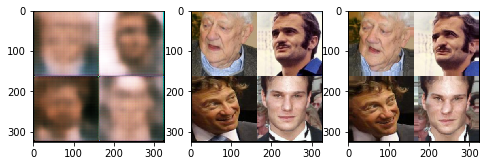

[6/10][0/4052]	Loss: 0.07128
[6/10][200/4052]	Loss: 0.06890
[6/10][400/4052]	Loss: 0.06881
[6/10][600/4052]	Loss: 0.06896
[6/10][800/4052]	Loss: 0.06892
[6/10][1000/4052]	Loss: 0.06891
[6/10][1200/4052]	Loss: 0.06884
[6/10][1400/4052]	Loss: 0.06882
[6/10][1600/4052]	Loss: 0.06878
[6/10][1800/4052]	Loss: 0.06872
[6/10][2000/4052]	Loss: 0.06868


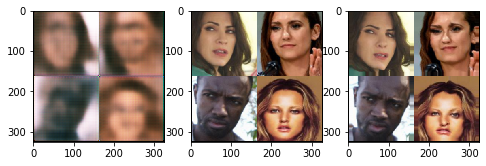

[6/10][2200/4052]	Loss: 0.06864
[6/10][2400/4052]	Loss: 0.06863
[6/10][2600/4052]	Loss: 0.06860
[6/10][2800/4052]	Loss: 0.06857
[6/10][3000/4052]	Loss: 0.06853
[6/10][3200/4052]	Loss: 0.06851
[6/10][3400/4052]	Loss: 0.06847
[6/10][3600/4052]	Loss: 0.06845
[6/10][3800/4052]	Loss: 0.06842
[6/10][4000/4052]	Loss: 0.06841


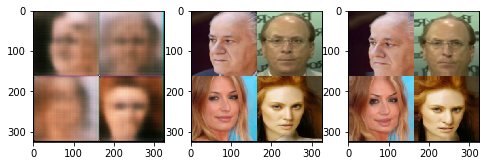

[6/10][4051/4052]	Loss: 0.06840
[6/10][4051/4052]	Tr Loss: 0.06840	Te Loss: 0.07800


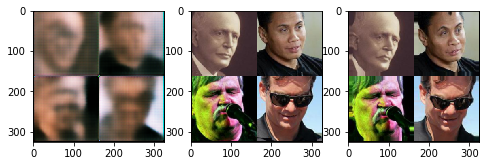

[7/10][0/4052]	Loss: 0.07078
[7/10][200/4052]	Loss: 0.06786
[7/10][400/4052]	Loss: 0.06777
[7/10][600/4052]	Loss: 0.06777
[7/10][800/4052]	Loss: 0.06775
[7/10][1000/4052]	Loss: 0.06768
[7/10][1200/4052]	Loss: 0.06760
[7/10][1400/4052]	Loss: 0.06762
[7/10][1600/4052]	Loss: 0.06761
[7/10][1800/4052]	Loss: 0.06757
[7/10][2000/4052]	Loss: 0.06757


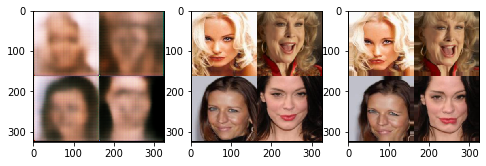

[7/10][2200/4052]	Loss: 0.06758
[7/10][2400/4052]	Loss: 0.06755
[7/10][2600/4052]	Loss: 0.06750
[7/10][2800/4052]	Loss: 0.06748
[7/10][3000/4052]	Loss: 0.06744
[7/10][3200/4052]	Loss: 0.06743
[7/10][3400/4052]	Loss: 0.06741
[7/10][3600/4052]	Loss: 0.06740
[7/10][3800/4052]	Loss: 0.06739
[7/10][4000/4052]	Loss: 0.06738


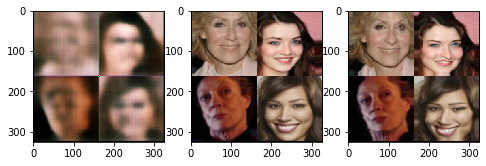

[7/10][4051/4052]	Loss: 0.06737
[7/10][4051/4052]	Tr Loss: 0.06737	Te Loss: 0.07891


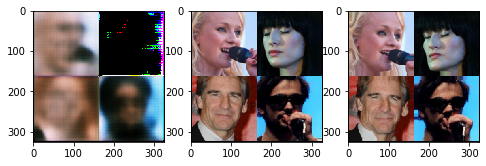

[8/10][0/4052]	Loss: 0.07387
[8/10][200/4052]	Loss: 0.06671
[8/10][400/4052]	Loss: 0.06683
[8/10][600/4052]	Loss: 0.06677
[8/10][800/4052]	Loss: 0.06676
[8/10][1000/4052]	Loss: 0.06670
[8/10][1200/4052]	Loss: 0.06668
[8/10][1400/4052]	Loss: 0.06673
[8/10][1600/4052]	Loss: 0.06673
[8/10][1800/4052]	Loss: 0.06668
[8/10][2000/4052]	Loss: 0.06662


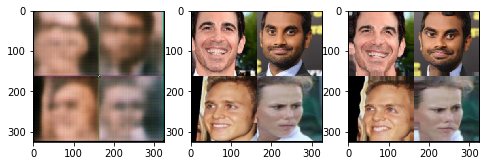

[8/10][2200/4052]	Loss: 0.06660
[8/10][2400/4052]	Loss: 0.06659
[8/10][2600/4052]	Loss: 0.06658
[8/10][2800/4052]	Loss: 0.06658
[8/10][3000/4052]	Loss: 0.06659
[8/10][3200/4052]	Loss: 0.06659
[8/10][3400/4052]	Loss: 0.06659
[8/10][3600/4052]	Loss: 0.06658
[8/10][3800/4052]	Loss: 0.06657
[8/10][4000/4052]	Loss: 0.06654


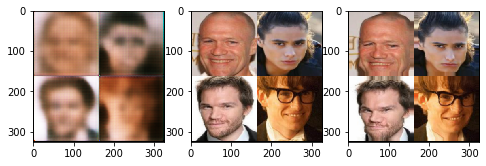

[8/10][4051/4052]	Loss: 0.06653
[8/10][4051/4052]	Tr Loss: 0.06653	Te Loss: 0.07661


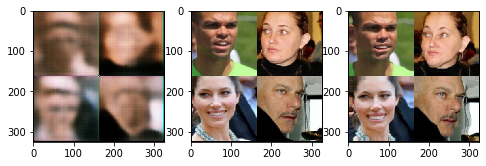

[9/10][0/4052]	Loss: 0.06773
[9/10][200/4052]	Loss: 0.06641
[9/10][400/4052]	Loss: 0.06622
[9/10][600/4052]	Loss: 0.06658
[9/10][800/4052]	Loss: 0.06660
[9/10][1000/4052]	Loss: 0.06655
[9/10][1200/4052]	Loss: 0.06652
[9/10][1400/4052]	Loss: 0.06641
[9/10][1600/4052]	Loss: 0.06635
[9/10][1800/4052]	Loss: 0.06628
[9/10][2000/4052]	Loss: 0.06631


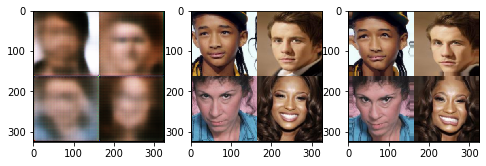

[9/10][2200/4052]	Loss: 0.06638
[9/10][2400/4052]	Loss: 0.06634
[9/10][2600/4052]	Loss: 0.06630
[9/10][2800/4052]	Loss: 0.06631
[9/10][3000/4052]	Loss: 0.06627
[9/10][3200/4052]	Loss: 0.06624
[9/10][3400/4052]	Loss: 0.06624
[9/10][3600/4052]	Loss: 0.06620
[9/10][3800/4052]	Loss: 0.06618
[9/10][4000/4052]	Loss: 0.06616


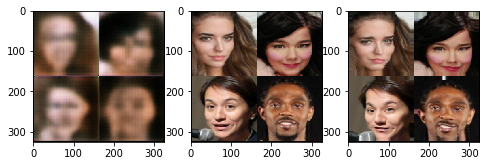

[9/10][4051/4052]	Loss: 0.06616
[9/10][4051/4052]	Tr Loss: 0.06616	Te Loss: 0.07487


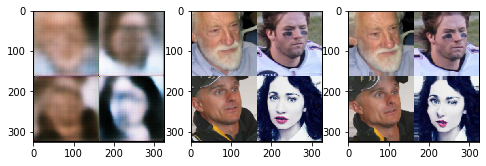

Copying file://./ae_noise_enc_2.1a.pt [Content-Type=application/octet-stream]...
/
Operation completed over 1 objects/134.4 MiB.                                    
Copying file://./ae_noise_dec_2.1a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/83.6 MiB.                                     
Copying file://./opt_ae_noise_2.1a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums

In [21]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=10, plot_images=2000)

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=10, plot_images=1500)

In [19]:
# lr.step()

for pg in optimizer.param_groups:
    print(pg['lr'])

5.23347633027361e-06


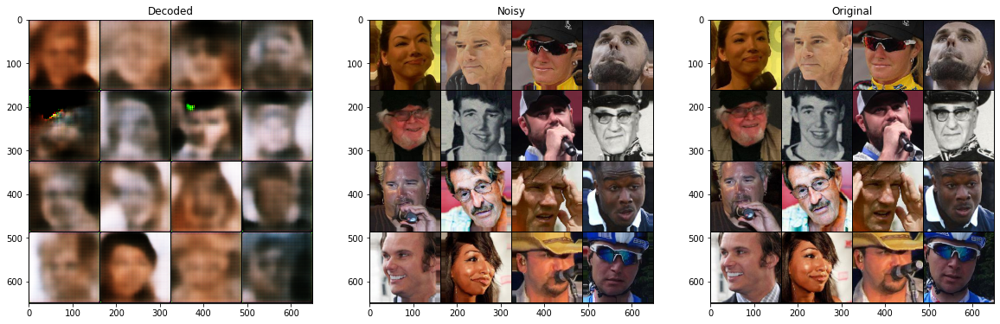

In [22]:
with torch.no_grad():
    autoencoder.train()
    inputs, labels = next(iter(test_loader))
    inputs = inputs.cuda()
    labels = labels.cuda()

    decoded = autoencoder(inputs)
    
    fig, ax = plt.subplots(1, 3, figsize=(20,60))
    ax[0].imshow(np.transpose(vutils.make_grid(decoded.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0].set_title("Decoded")
    ax[1].imshow(np.transpose(vutils.make_grid(inputs.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1].set_title("Noisy")
    ax[2].imshow(np.transpose(vutils.make_grid(labels.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[2].set_title("Original")
    plt.show()   

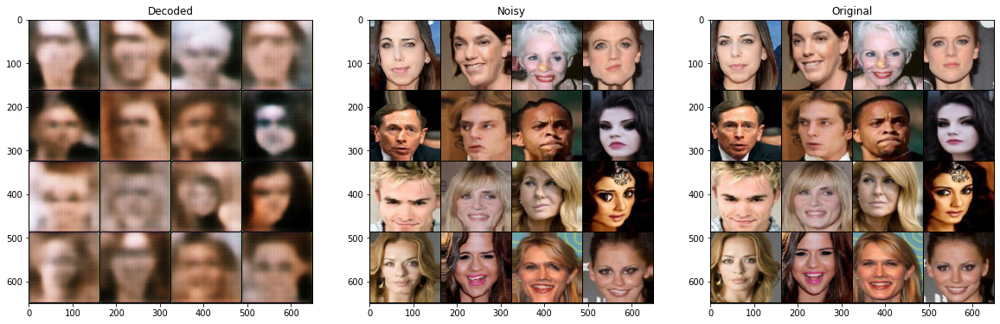

In [23]:
with torch.no_grad():
    autoencoder.train()
    inputs, labels = next(iter(train_loader))
    inputs = inputs.cuda()
    labels = labels.cuda()

    decoded = autoencoder(inputs)
    
    fig, ax = plt.subplots(1, 3, figsize=(20,60))
    ax[0].imshow(np.transpose(vutils.make_grid(decoded.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0].set_title("Decoded")
    ax[1].imshow(np.transpose(vutils.make_grid(inputs.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1].set_title("Noisy")
    ax[2].imshow(np.transpose(vutils.make_grid(labels.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[2].set_title("Original")
    plt.show()